# Keep Client 

In [221]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import wordcloud as wc

### Current Metrics

Client Survey 

Name: NPS-Likely to Recommend // API Name: X2016_Q5__c // Values: 0-10  
Name: Satisfaction Score // API Name: X_2016_Q_2_C // Values: 0-10  
Name: Trust Score // API Name: Trust_Score_c // Values: Formula defined 

Household  

Name: DSLC // API Name: Days_Last_Contact__c // Values: Numeric  
Name: DSLCR // API Name: Days_Since_Last_Client_Review__c // Values: Numeric  





### Current IDs & Groups for Grouping

Household  
Name: Account Name/ID  

Team Member  
Name: Pod Name/ID  
Name: Lead Advisor  

### Thoughts  

2 main ways to enhance KPIs or Explore further outside of the box:  
1. Go more granular with the KPI (more specific questions)
    - Do a frequency/count of what we have in client survey, see if other measurements are well populated  
2. Explore KPI against other variables (bivariate), both metrics and/or groupings  
    - Go deeper than Pods, analyze delivery & capacity contexts vs metrics
        - Nature of the delivery is more influential on the client experience, not label of "Pod A" or "Pod B"
            - Since core delivery theoretically shouldn't change from Pod to Pod
        - LA (& AA?) Avg Number of Total Clients they have vs Metrics
        - Service Team (LA, AA) cumulative satisfaction vs Metrics
    - Incorporate more Client contextual pieces
        - Client Descriptives
            - Age/Gender vs Metrics
            - Client Tenure vs Metrics  
            - Client Engagement vs Metrics
            - Original Client Lead Source vs Metrics
            - Review Frequency vs Metrics
            - Industry, Employment Status not in Snowflake but can be checked
        - Client Active Action
            - Total Opportunities Referred & Total Referrals vs Metrics
            - Subscription Patterns vs Metrics
                - Marketo activity would be nice, but complex
        - Client Experience / Our Rhythm of Business (First Impression, Client Pulse, Action Maangement i.e. Billing)
            - Opp Stage Analysis/Movement vs Metrics
            - Billing Descriptives vs Metrics
                - Sentiment Analysis at each Event Occurrence

        


In [222]:
# Get Datasets
hh_df = pd.read_csv("sfl_hh.csv")
clientsurv_df = pd.read_csv("sfl_cs.csv")
clientsurv_more_df = pd.read_csv("client_surv_more.csv")

reporting_lob_df = pd.read_csv("reporting_opp_source.csv")
bd_cal_df = pd.read_csv("bd_year_date_helper.csv")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\301695993.py:2: DtypeWarning: Columns (62) have mixed types. Specify dtype option on import or set low_memory=False.
  hh_df = pd.read_csv("sfl_hh.csv")


In [223]:
# Specify Ordering for DSLC(R) Categories
dslc_order_list = ["< 90", "90-180", "181-360", "> 360", "No Contact"]
dslcr_order_list = ["<= 180", "181-270", "271-360", "> 360", "No Review Meeting"]


In [224]:
# Separate Lead Source Channels by Relevancy
LS_Major = ["Client Referral", "Fidelity", "Self Generated"]
LS_Minor = ["Digital Marketing", "Mass Affluent", "Other", "Winback"]

In [225]:
# Helper Function to Plot
def plotData(datadf, groupbyvar, xvar, yvar, 
             intitle, inylabel, inxlabel, 
             legendorder, legendcolor,
             exportpath, saveyn):
    # Count Number of Labels
    label_count = 0
    # Initialize Figure
    fig, ax = plt.subplots(figsize=(12, 8))
    # Plot 
    if not legendcolor:
        for label, df in datadf.groupby(groupbyvar):
            df.plot(x = xvar, y = yvar, ax=ax, label=label, marker = ".")
            label_count += 1
    else:
        for label, df in datadf.groupby(groupbyvar):
            df.plot(x = xvar, y = yvar, ax=ax, label=label, marker = ".", color = legendcolor[label_count])
            label_count += 1
    # Set Graph Elements (Title, Axis Labels)
    ax.set(title= intitle,  #Set a title and x-and y-axis labels
                ylabel= inylabel, 
                xlabel= inxlabel)
    # Manually Set Values for X Axis
    ax.xaxis.set(ticks=range(0,len(datadf[xvar].unique().tolist())),  
                ticklabels=datadf[xvar].unique().tolist())
    # Rotate Axises
    plt.xticks(rotation=45, ha='right')
    # Add Y Axis Grid Lines
    ax.grid(axis = "y")

    # Check if a legend order was specified
    if not legendorder:
        new_order = list(range(0, label_count))
    else:
        new_order = legendorder

    #get handles and labels
    handles, labels = plt.gca().get_legend_handles_labels()

    # add legend to plot and position legend
    ax.legend([handles[idx] for idx in new_order],[labels[idx] for idx in new_order], 
            loc='upper center', bbox_to_anchor=(0.5, 1.015),
            ncol=label_count, fancybox=True, shadow=True)

    # Save Image
    if(saveyn):
        plt.savefig("figures/" + exportpath)

### Client Survey

In [226]:
missing_data_in_df = pd.DataFrame({'NaN_Prop': (clientsurv_df.isna().sum() / clientsurv_df.shape[0]) * 100}).sort_values(by='NaN_Prop', ascending=False)
missing_data_in_df.reset_index(inplace = True)
missing_data_in_df.rename(columns = {"index": "col_name"}, inplace = True)
missing_data_in_df = missing_data_in_df[(missing_data_in_df["NaN_Prop"] > 0.0) & (missing_data_in_df["NaN_Prop"] < 90.0)]

In [227]:
missing_data_in_df

,col_name,NaN_Prop
1,TRUST_SCORE_C,78.976546
2,NPS_CATEGORY,15.000000
3,LIKELY_TO_RECOMMEND,15.000000
4,SATISFACTION_SCORE,14.872068
5,CAMPAIGN_C,8.198294
6,CAMPAIGN_NAME,8.198294
7,FOLLOW_UP_STATUS_C,7.356077
8,LEAD_ADVISOR_C,4.957356


Takeaway: Likely to Recommend (Q5) & Satisfaction Score (Q2) are still missing about 30% of the time.  
Takeaway: What is it that Keeps you Here (Q7) & What would make you leave (Q8) are only marginally more missing (~40%) but seems very insightful and extremely relevant to KC, might want to include these   
Takeaway: Why did you select Brighton Jones (Q1), Where does Brighton Jones Excel (Q3) are ~60% missing, could be explored to see if these are worth more enforcing if the responses are valuable  
Takeaway: Where does BJ need to improve (Q4), What topics do you want to hear more of (Q6) are largely missing (~80%) but these are important for the "on the fence"/yellow RAR clients - these are the important topics that if addressed can win clients back.  

### Bivariate Review

In [228]:
hh_df.columns

Index(['CREATED_DATE', 'ID', 'HOUSEHOLD_NAME', 'CLIENT_1_SALESFORCE_ID_C',
       'PRIMARY_AGE_C', 'CLIENT_2_SALESFORCE_ID_C', 'SECONDARY_AGE_C',
       'RECORD_TYPE_ID', 'RECORD_TYPE_NAME', 'PARENT_ID', 'TYPE',
       'BILLING_STATE', 'CLIENT_SURVEYS_C', 'CLIENT_ANNIVERSARY_C',
       'HEAD_OF_HOUSEHOLD_C', 'PREFERRED_MAILING_NAME_C',
       'SECONDARY_HOUSEHOLD_CONTACT_C', 'REVIEW_ELIGIBLE', 'ACCOUNT_OWNER',
       'ASSOCIATE_ADVISOR', 'ANALYST', 'LEAD_ADVISOR',
       'CLIENT_SERVICE_COORDINATOR', 'TAX_LEAD_ADVISOR', 'POD_LOOKUP',
       'LAST_ACTIVITY_DATE', 'WEALTH_LEAD_SOURCE', 'RESTRICTED_ACCESS_C',
       'CLIENT_ID_C', 'START_IMPLEMENTATION_C', 'IMPLEMENTATION_COMPLETE_C',
       'REVIEW_FREQUENCY_C', 'CLIENT_ENGAGEMENT_RANK_C', 'RANK_REASON_C',
       'RANK_LAST_MODIFIED_C', 'LAST_SIGNIFICANT_CONTACT_C',
       'LAST_SIGNIFICANT_EMAIL_C', 'LAST_SIGNIFICANT_EVENT_C',
       'LAST_SIGNIFICANT_TASK_C', 'DATE_LAST_CLIENT_REVIEW_C',
       'DATE_LAST_FT_F_MEETING_C', 'WEALTH_CLIEN

In [229]:
clientsurv_df.columns

Index(['CAMPAIGN_C', 'CAMPAIGN_NAME', 'CLIENT_C', 'CONTACT_C', 'IS_CLIENT',
       'ACCOUNT_ID', 'SURVEY_DATE', 'FOLLOW_UP_STATUS_C',
       'REFERRAL_CALL_COMPLETED_C', 'SURVEY_ID', 'LEAD_ADVISOR_C',
       'RECORDTYPE', 'REPORTING_RECORDTYPE', 'SURVEY_TYPE_C',
       'REPORTING_SURVEY_TYPE_C', 'TRUST_SCORE_C', 'SATISFACTION_SCORE',
       'LIKELY_TO_RECOMMEND', 'NPS_CALCULATION', 'NPS_CATEGORY',
       'DATE_CATEGORY', 'SURVEY_IN_LAST_7_DAYS', 'RN'],
      dtype='object')

In [230]:
# Prologue: get some initial counts on surveys
q0_df = clientsurv_df.merge(hh_df, how = "left", left_on = "ACCOUNT_ID", right_on = "ID")
q0_df = q0_df[["ACCOUNT_ID", "SURVEY_DATE", "LIKELY_TO_RECOMMEND", "CLIENT_ENGAGEMENT_RANK_C"]]
q0_df["SURVEY_DATE"] = (pd.to_datetime(q0_df["SURVEY_DATE"])).dt.strftime('%Y-%m-%d')
q0_df = q0_df.merge(bd_cal_df[["ACTUAL_DATE", "BD_YEAR", "BD_YYYY_QQ"]], how = "left", left_on = "SURVEY_DATE", right_on = "ACTUAL_DATE")
q0_df = q0_df[q0_df["BD_YEAR"] >= 2022]

In [231]:
# Create Manual NPS Category
#define conditions
conditions = [
    (q0_df['LIKELY_TO_RECOMMEND'] >= 0.0) & (q0_df['LIKELY_TO_RECOMMEND'] < 6.5),
    (q0_df['LIKELY_TO_RECOMMEND'] >= 6.5) & (q0_df['LIKELY_TO_RECOMMEND'] < 8.5),
    (q0_df['LIKELY_TO_RECOMMEND'] >= 8.5) & (q0_df['LIKELY_TO_RECOMMEND'] <= 10.0)
]

#define results
results = ['Detractors (0-6)', 'Passives (7-8)', 'Promoters (9-10)']

#create new column based on conditions in column1 and column2
q0_df['NPS_CATEGORY'] = np.select(conditions, results)

In [232]:
q0_df

,ACCOUNT_ID,SURVEY_DATE,LIKELY_TO_RECOMMEND,CLIENT_ENGAGEMENT_RANK_C,ACTUAL_DATE,BD_YEAR,BD_YYYY_QQ,NPS_CATEGORY
4692,0012R00002LMVHrQAP,2024-02-04,10.0,Yellow,2024-02-04,2024,2024 Q2,Promoters (9-10)
4693,0012R00002L1i7zQAB,2024-02-04,10.0,Yellow,2024-02-04,2024,2024 Q2,Promoters (9-10)
4694,0012R00002KQEPWQA5,2024-02-04,10.0,Yellow,2024-02-04,2024,2024 Q2,Promoters (9-10)
4695,0012R00002HWhbEQAT,2024-02-04,9.0,Green,2024-02-04,2024,2024 Q2,Promoters (9-10)
4696,001E000000dUhUjIAK,2024-02-04,8.0,Green,2024-02-04,2024,2024 Q2,Passives (7-8)
...,...,...,...,...,...,...,...,...
8175,0014400001qVOkPAAW,2021-10-01,NaN,Green,2021-10-01,2022,2022 Q1,0
8176,0012R00002DMrmBQAT,2021-10-01,10.0,Green,2021-10-01,2022,2022 Q1,Promoters (9-10)
8177,001E000001HuXdhIAF,2021-10-01,8.0,Green,2021-10-01,2022,2022 Q1,Passives (7-8)
8178,0012R000029qX5GQAU,2021-10-01,9.0,Green,2021-10-01,2022,2022 Q1,Promoters (9-10)


In [233]:
# Prologue A: Get a Stacked Bar Chart of x axis each year, y axis as count of surveys, grouping is NPS Category
cross_tab_a = pd.crosstab(q0_df["BD_YYYY_QQ"], q0_df['NPS_CATEGORY'], dropna = False).reset_index()
cross_tab_a.rename(columns = {'0': 'N/A'}, inplace = True)
cross_tab_a

NPS_CATEGORY,BD_YYYY_QQ,N/A,Detractors (0-6),Passives (7-8),Promoters (9-10)
0,2022 Q1,2,13,51,286
1,2022 Q2,3,13,47,318
2,2022 Q3,3,3,23,168
3,2022 Q4,338,12,39,235
4,2023 Q1,16,3,22,133
5,2023 Q2,9,4,46,302
6,2023 Q3,8,7,39,304
7,2023 Q4,9,9,48,339
8,2024 Q1,13,16,50,371
9,2024 Q2,11,5,20,150


In [234]:
cross_tab_a = cross_tab_a.set_index('BD_YYYY_QQ')
cross_tab_a["Total Surveys"] = cross_tab_a["N/A"] + cross_tab_a["Detractors (0-6)"] + cross_tab_a["Passives (7-8)"] + cross_tab_a["Promoters (9-10)"]

In [235]:
cross_tab_a

NPS_CATEGORY,N/A,Detractors (0-6),Passives (7-8),Promoters (9-10),Total Surveys
BD_YYYY_QQ,,,,,
2022 Q1,2,13,51,286,352
2022 Q2,3,13,47,318,381
2022 Q3,3,3,23,168,197
2022 Q4,338,12,39,235,624
2023 Q1,16,3,22,133,174
2023 Q2,9,4,46,302,361
2023 Q3,8,7,39,304,358
2023 Q4,9,9,48,339,405
2024 Q1,13,16,50,371,450


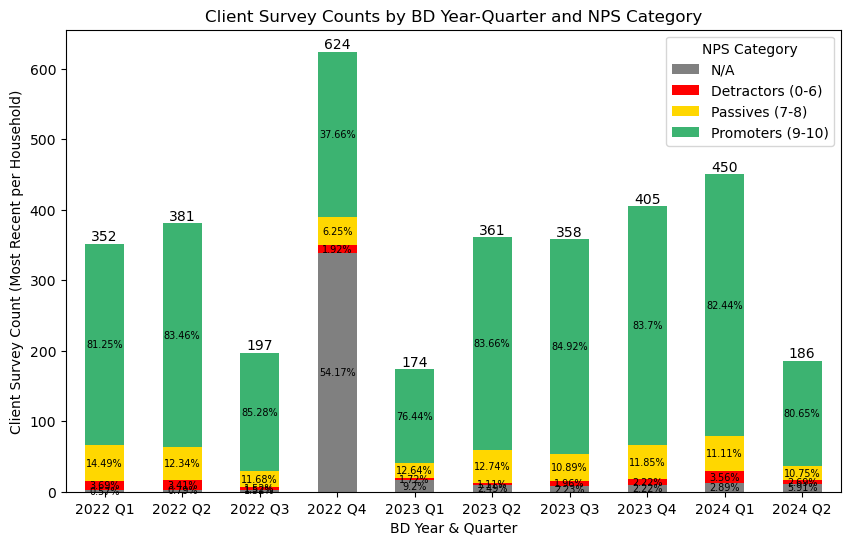

In [236]:
# calculate the percent for each row
per = cross_tab_a.iloc[:, :-1].div(cross_tab_a['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = cross_tab_a.iloc[:, :-1].plot(kind='bar', stacked=True, figsize=(10, 6), rot=0, color = ['gray', 'red', 'gold','mediumseagreen'])
ax.legend(loc='upper right', title = "NPS Category")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "Client Survey Counts by BD Year-Quarter and NPS Category",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "BD Year & Quarter")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = per[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='center', fontsize=7)

# annotate the top of the bar with the full count
_ = ax.bar_label(ax.containers[-1], label_type='edge')

plt.savefig('figures/q0a.png')

In [237]:
# Prologue B: Get a Stacked Bar Chart of x axis each year, y axis as count of surveys, grouping is RAR Category
cross_tab_b = pd.crosstab(q0_df["BD_YYYY_QQ"], q0_df['CLIENT_ENGAGEMENT_RANK_C'], dropna = False).reset_index()
cross_tab_b.rename(columns = {'0': 'N/A'}, inplace = True)
cross_tab_b

CLIENT_ENGAGEMENT_RANK_C,BD_YYYY_QQ,Green,Red,Yellow
0,2022 Q1,305,14,33
1,2022 Q2,318,9,54
2,2022 Q3,158,11,28
3,2022 Q4,531,14,78
4,2023 Q1,137,7,30
5,2023 Q2,305,11,45
6,2023 Q3,296,4,58
7,2023 Q4,324,9,72
8,2024 Q1,348,5,97
9,2024 Q2,132,6,48


In [238]:
cross_tab_b = cross_tab_b[["BD_YYYY_QQ","Red", "Yellow", "Green"]]

In [239]:
cross_tab_b = cross_tab_b.set_index('BD_YYYY_QQ')
cross_tab_b["Total Surveys"] = cross_tab_b["Green"] + cross_tab_b["Yellow"] + cross_tab_b["Red"]

In [240]:
cross_tab_b

CLIENT_ENGAGEMENT_RANK_C,Red,Yellow,Green,Total Surveys
BD_YYYY_QQ,,,,
2022 Q1,14,33,305,352
2022 Q2,9,54,318,381
2022 Q3,11,28,158,197
2022 Q4,14,78,531,623
2023 Q1,7,30,137,174
2023 Q2,11,45,305,361
2023 Q3,4,58,296,358
2023 Q4,9,72,324,405
2024 Q1,5,97,348,450


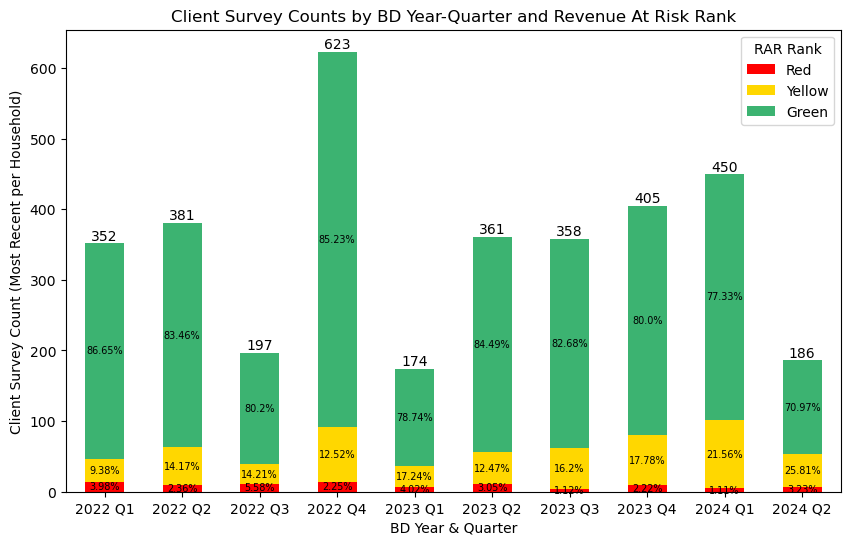

In [241]:
# calculate the percent for each row
perb = cross_tab_b.iloc[:, :-1].div(cross_tab_b['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = cross_tab_b.iloc[:, :-1].plot(kind='bar', stacked=True, figsize=(10, 6), rot=0, color = ['red', 'gold', 'mediumseagreen'])
ax.legend(loc='upper right', title = "RAR Rank")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "Client Survey Counts by BD Year-Quarter and Revenue At Risk Rank",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "BD Year & Quarter")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = perb[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='center', fontsize=7)

# annotate the top of the bar with the full count
_ = ax.bar_label(ax.containers[-1], label_type='edge')

plt.savefig('figures/q0b.png')

In [242]:
#q1: Prep KC Metric by Channel
q1_df = clientsurv_df.merge(hh_df, how = "left", left_on = "ACCOUNT_ID", right_on = "ID")
q1_df = q1_df[["ACCOUNT_ID", "SURVEY_DATE", "TRUST_SCORE_C", "SATISFACTION_SCORE", "LIKELY_TO_RECOMMEND", "WEALTH_LEAD_SOURCE"]]
q1_df["SURVEY_DATE"] = (pd.to_datetime(q1_df["SURVEY_DATE"])).dt.strftime('%Y-%m-%d')
q1_df = q1_df.merge(reporting_lob_df, how = "left", left_on = "WEALTH_LEAD_SOURCE", right_on = "LEAD_SOURCE")
q1_df = q1_df.merge(bd_cal_df[["ACTUAL_DATE", "BD_YEAR", "BD_YYYY_QQ"]], how = "left", left_on = "SURVEY_DATE", right_on = "ACTUAL_DATE")

In [243]:
q1_df

,ACCOUNT_ID,SURVEY_DATE,TRUST_SCORE_C,SATISFACTION_SCORE,LIKELY_TO_RECOMMEND,WEALTH_LEAD_SOURCE,LEAD_SOURCE,REPORTING_CHANNEL,ACTUAL_DATE,BD_YEAR,BD_YYYY_QQ
0,001E000001UO6bdIAD,2021-05-19,NaN,10.0,10.0,Self Generated,Self Generated,Self Generated,2021-05-19,2021,2021 Q3
1,001E000000dUhMbIAK,2021-05-19,NaN,9.0,10.0,Client,Client,Client Referral,2021-05-19,2021,2021 Q3
2,001E000001U3ovjIAB,2021-05-19,NaN,10.0,10.0,Fidelity,Fidelity,Fidelity,2021-05-19,2021,2021 Q3
3,0012R00002981oAQAQ,2021-05-19,NaN,8.0,8.0,Client,Client,Client Referral,2021-05-19,2021,2021 Q3
4,0012R000027laCzQAI,2021-05-19,NaN,10.0,10.0,Client,Client,Client Referral,2021-05-19,2021,2021 Q3
...,...,...,...,...,...,...,...,...,...,...,...
9375,001E000001ROb9eIAD,2021-05-19,NaN,10.0,9.0,Fidelity,Fidelity,Fidelity,2021-05-19,2021,2021 Q3
9376,001E000000dUhT9IAK,2021-05-19,NaN,9.0,10.0,Client,Client,Client Referral,2021-05-19,2021,2021 Q3
9377,001E000000dUhCJIA0,2021-05-19,NaN,10.0,10.0,Fidelity,Fidelity,Fidelity,2021-05-19,2021,2021 Q3
9378,0012R00002BoEGPQA3,2021-05-19,NaN,10.0,10.0,Self Generated,Self Generated,Self Generated,2021-05-19,2021,2021 Q3


In [244]:
# Split into Major and Minor Reporting Channels, decided by Revenue
q1_maj_df = q1_df[q1_df["REPORTING_CHANNEL"].isin(LS_Major)]
q1_min_df = q1_df[q1_df["REPORTING_CHANNEL"].isin(LS_Minor)]

In [245]:
# q1a: Analyze NPS Score by Channel
q1a_maj_df = q1_maj_df.groupby(['BD_YYYY_QQ', 'REPORTING_CHANNEL'], as_index = False)["LIKELY_TO_RECOMMEND"].mean()
q1a_maj_df = q1a_maj_df[q1a_maj_df["BD_YYYY_QQ"] >= "2020 Q1"]

q1a_min_df = q1_min_df.groupby(['BD_YYYY_QQ', 'REPORTING_CHANNEL'], as_index = False)["LIKELY_TO_RECOMMEND"].mean()
q1a_min_df = q1a_min_df[q1a_min_df["BD_YYYY_QQ"] >= "2020 Q1"]

In [246]:
#q1a_maj_df

In [247]:
#q1a_min_df

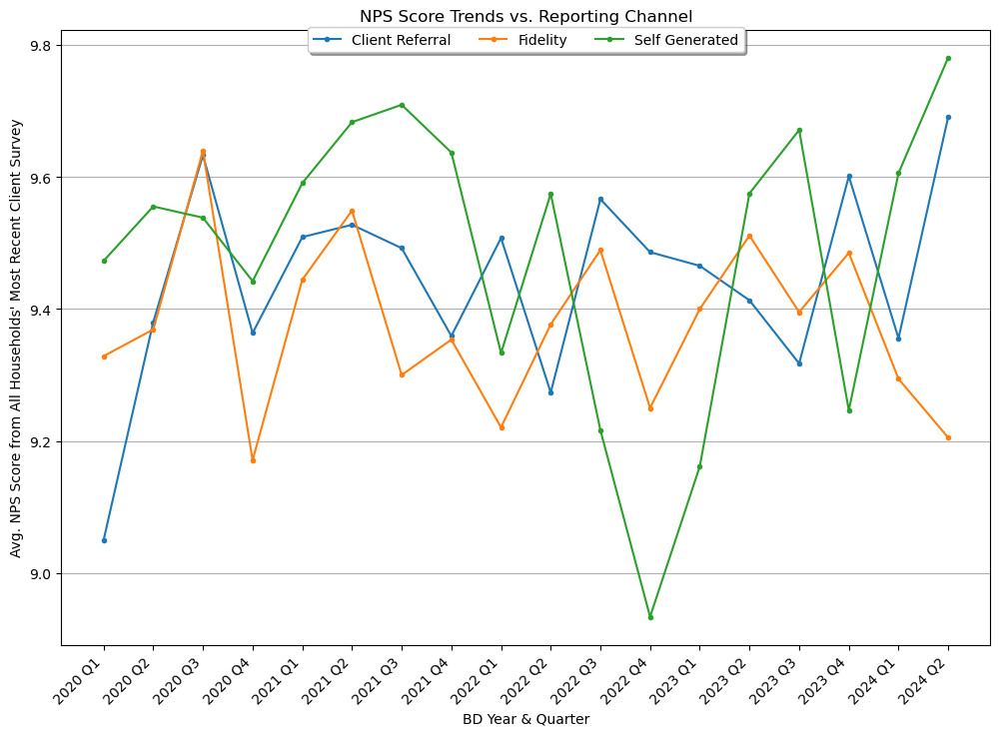

In [248]:
plotData(datadf = q1a_maj_df, 
         groupbyvar = "REPORTING_CHANNEL", 
         xvar = "BD_YYYY_QQ", 
         yvar = "LIKELY_TO_RECOMMEND", 
         intitle = 'NPS Score Trends vs. Reporting Channel', 
         inylabel = "Avg. NPS Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = [],
         exportpath = 'q1a_maj_df.png', 
         saveyn = True)

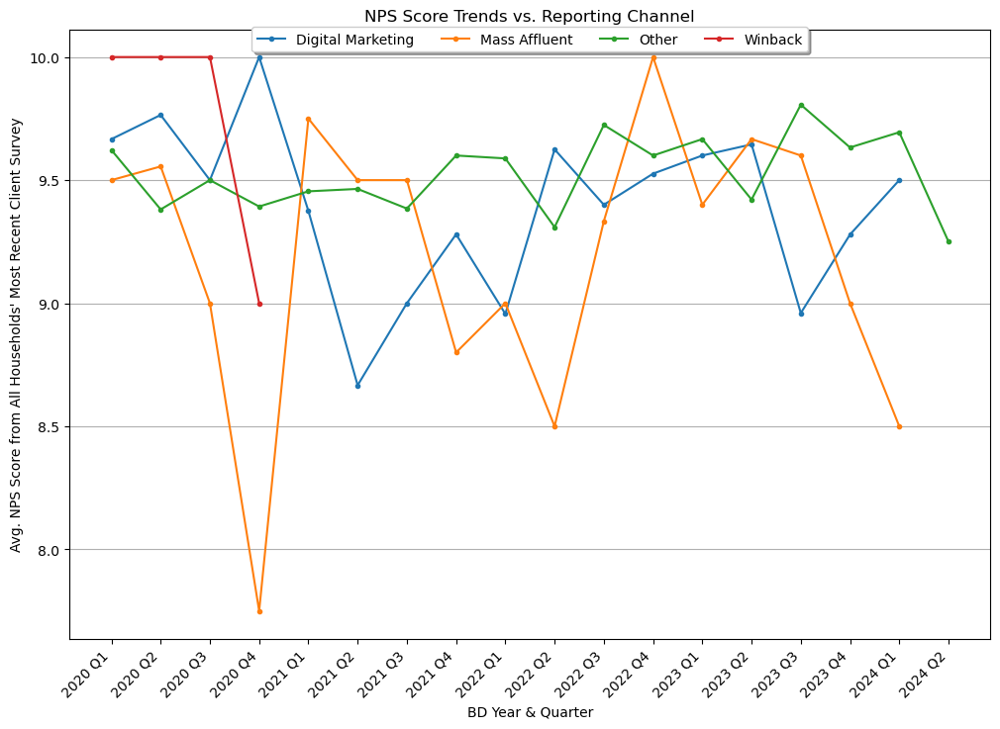

In [249]:
plotData(datadf = q1a_min_df, 
         groupbyvar = "REPORTING_CHANNEL", 
         xvar = "BD_YYYY_QQ", 
         yvar = "LIKELY_TO_RECOMMEND", 
         intitle = 'NPS Score Trends vs. Reporting Channel', 
         inylabel = "Avg. NPS Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = [],
         exportpath = 'q1a_min_df.png', 
         saveyn = True)

In [250]:
# q1b Mean Trust Score by Revenue Channel
q1b_maj_df = q1_maj_df.groupby(['BD_YYYY_QQ', 'REPORTING_CHANNEL'], as_index = False)["TRUST_SCORE_C"].mean()
q1b_maj_df = q1b_maj_df[q1b_maj_df["BD_YYYY_QQ"] >= "2022 Q4"]

q1b_min_df = q1_min_df.groupby(['BD_YYYY_QQ', 'REPORTING_CHANNEL'], as_index = False)["TRUST_SCORE_C"].mean()
q1b_min_df = q1b_min_df[q1b_min_df["BD_YYYY_QQ"] >= "2022 Q4"]

In [251]:
#q1b_maj_df

In [252]:
#q1b_min_df

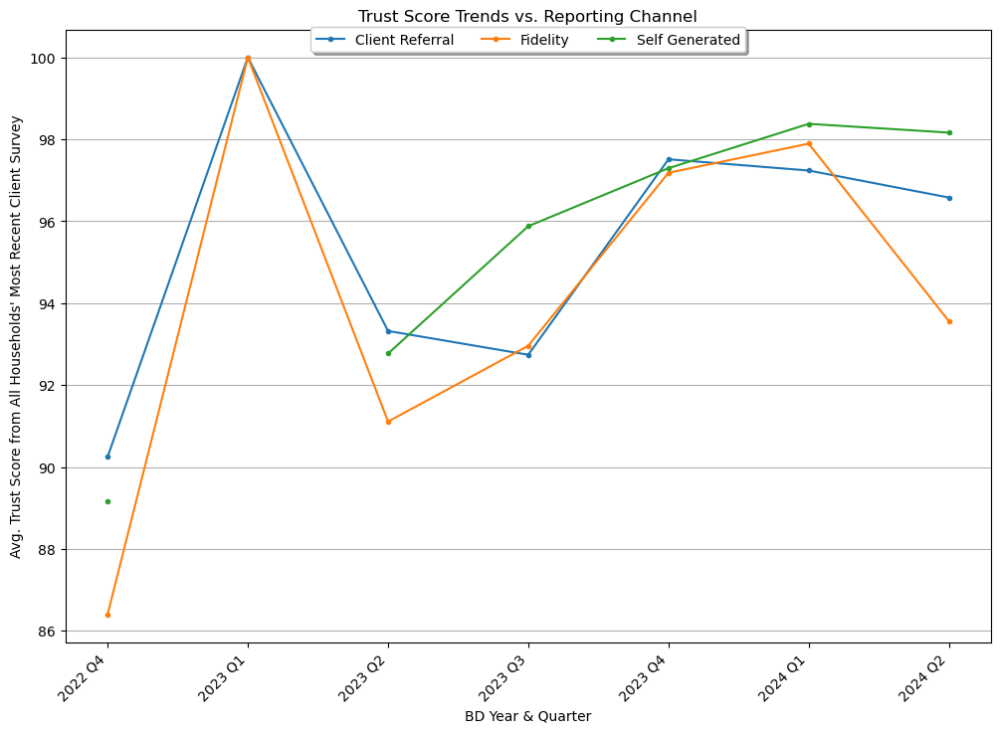

In [253]:
plotData(datadf = q1b_maj_df, 
         groupbyvar = "REPORTING_CHANNEL", 
         xvar = "BD_YYYY_QQ", 
         yvar = "TRUST_SCORE_C", 
         intitle = 'Trust Score Trends vs. Reporting Channel', 
         inylabel = "Avg. Trust Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = [],
         exportpath = 'q1b_maj_df.png', 
         saveyn = True)

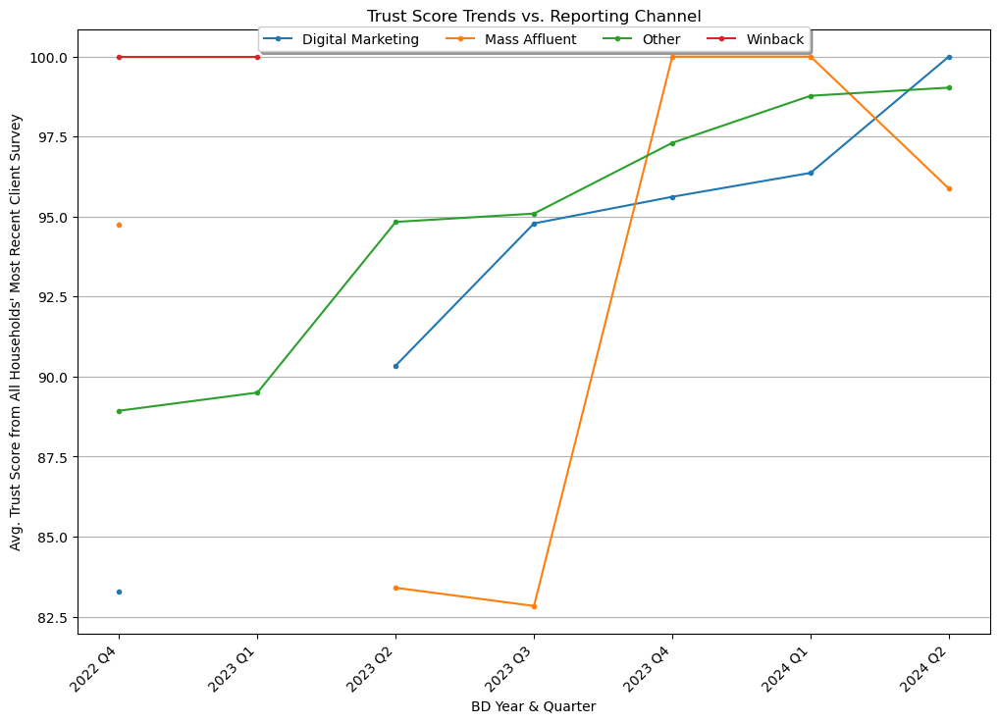

In [254]:
plotData(datadf = q1b_min_df, 
         groupbyvar = "REPORTING_CHANNEL", 
         xvar = "BD_YYYY_QQ", 
         yvar = "TRUST_SCORE_C", 
         intitle = 'Trust Score Trends vs. Reporting Channel', 
         inylabel = "Avg. Trust Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = [],
         exportpath = 'q1b_min_df.png', 
         saveyn = True)

In [255]:
# q1c Check Avg Satisfaction Score by Revenue Channel over Time
q1c_maj_df = q1_maj_df.groupby(['BD_YYYY_QQ', 'REPORTING_CHANNEL'], as_index = False)["SATISFACTION_SCORE"].mean()
q1c_maj_df = q1c_maj_df[q1c_maj_df["BD_YYYY_QQ"] >= "2020 Q1"]

q1c_min_df = q1_min_df.groupby(['BD_YYYY_QQ', 'REPORTING_CHANNEL'], as_index = False)["SATISFACTION_SCORE"].mean()
q1c_min_df = q1c_min_df[q1c_min_df["BD_YYYY_QQ"] >= "2020 Q1"]

In [256]:
#q1c_maj_df

In [257]:
#q1c_min_df

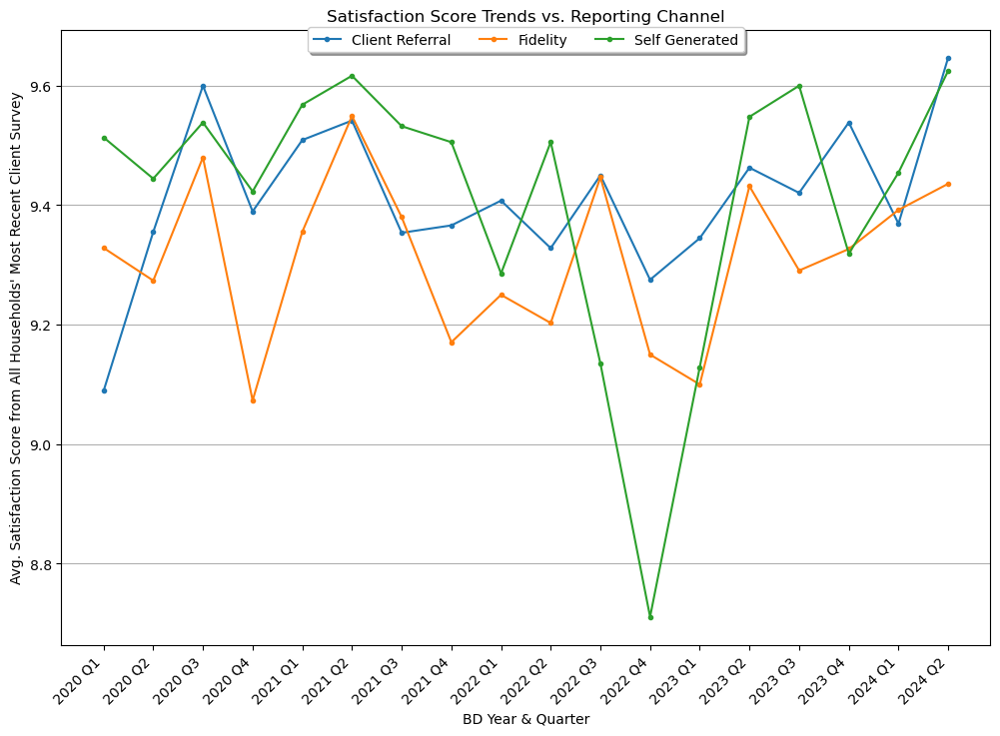

In [258]:
plotData(datadf = q1c_maj_df, 
         groupbyvar = "REPORTING_CHANNEL", 
         xvar = "BD_YYYY_QQ", 
         yvar = "SATISFACTION_SCORE", 
         intitle = 'Satisfaction Score Trends vs. Reporting Channel', 
         inylabel = "Avg. Satisfaction Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = [],
         exportpath = 'q1c_maj_df.png', 
         saveyn = True)

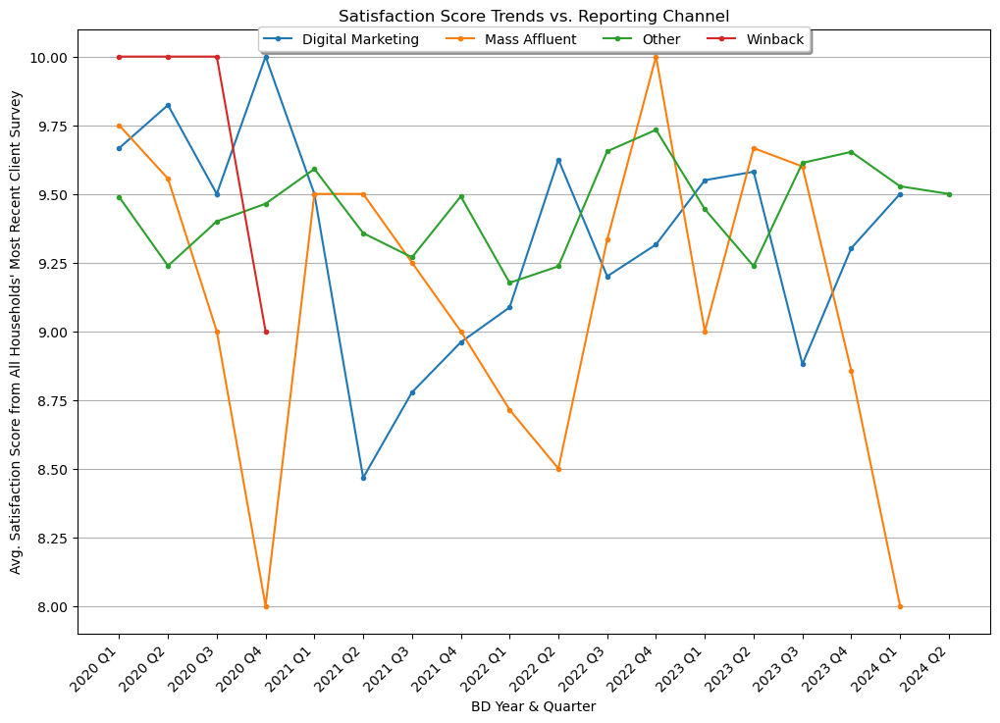

In [259]:
plotData(datadf = q1c_min_df, 
         groupbyvar = "REPORTING_CHANNEL", 
         xvar = "BD_YYYY_QQ", 
         yvar = "SATISFACTION_SCORE", 
         intitle = 'Satisfaction Score Trends vs. Reporting Channel', 
         inylabel = "Avg. Satisfaction Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = [],
         exportpath = 'q1c_min_df.png', 
         saveyn = True)

In [260]:
# q2 How does DSLC and DSLCR relate with the KC Survey Metrics?
q2_df = clientsurv_df.merge(hh_df, how = "left", left_on = "ACCOUNT_ID", right_on = "ID")
q2_df = q2_df[["ACCOUNT_ID", "SURVEY_DATE", "TRUST_SCORE_C", "SATISFACTION_SCORE", "LIKELY_TO_RECOMMEND", "WEALTH_LEAD_SOURCE", "DSLC_CATEGORY", "DSLCR_CATEGORY"]]
q2_df["SURVEY_DATE"] = (pd.to_datetime(q2_df["SURVEY_DATE"])).dt.strftime('%Y-%m-%d')
q2_df = q2_df.merge(reporting_lob_df, how = "left", left_on = "WEALTH_LEAD_SOURCE", right_on = "LEAD_SOURCE")
q2_df = q2_df.merge(bd_cal_df[["ACTUAL_DATE", "BD_YEAR", "BD_YYYY_QQ"]], how = "left", left_on = "SURVEY_DATE", right_on = "ACTUAL_DATE")

In [261]:
q2_df

,ACCOUNT_ID,SURVEY_DATE,TRUST_SCORE_C,SATISFACTION_SCORE,LIKELY_TO_RECOMMEND,WEALTH_LEAD_SOURCE,DSLC_CATEGORY,DSLCR_CATEGORY,LEAD_SOURCE,REPORTING_CHANNEL,ACTUAL_DATE,BD_YEAR,BD_YYYY_QQ
0,001E000001UO6bdIAD,2021-05-19,NaN,10.0,10.0,Self Generated,< 90,<= 180,Self Generated,Self Generated,2021-05-19,2021,2021 Q3
1,001E000000dUhMbIAK,2021-05-19,NaN,9.0,10.0,Client,< 90,<= 180,Client,Client Referral,2021-05-19,2021,2021 Q3
2,001E000001U3ovjIAB,2021-05-19,NaN,10.0,10.0,Fidelity,< 90,<= 180,Fidelity,Fidelity,2021-05-19,2021,2021 Q3
3,0012R00002981oAQAQ,2021-05-19,NaN,8.0,8.0,Client,> 360,> 360,Client,Client Referral,2021-05-19,2021,2021 Q3
4,0012R000027laCzQAI,2021-05-19,NaN,10.0,10.0,Client,< 90,<= 180,Client,Client Referral,2021-05-19,2021,2021 Q3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9375,001E000001ROb9eIAD,2021-05-19,NaN,10.0,9.0,Fidelity,< 90,<= 180,Fidelity,Fidelity,2021-05-19,2021,2021 Q3
9376,001E000000dUhT9IAK,2021-05-19,NaN,9.0,10.0,Client,< 90,<= 180,Client,Client Referral,2021-05-19,2021,2021 Q3
9377,001E000000dUhCJIA0,2021-05-19,NaN,10.0,10.0,Fidelity,< 90,<= 180,Fidelity,Fidelity,2021-05-19,2021,2021 Q3
9378,0012R00002BoEGPQA3,2021-05-19,NaN,10.0,10.0,Self Generated,< 90,<= 180,Self Generated,Self Generated,2021-05-19,2021,2021 Q3


In [262]:
# q2a DSLC vs. NPS Score
q2a_df = q2_df.groupby(['BD_YYYY_QQ', 'DSLC_CATEGORY'], as_index = False)["LIKELY_TO_RECOMMEND"].mean()
q2a_df = q2a_df[q2a_df["BD_YYYY_QQ"] >= "2020 Q1"]

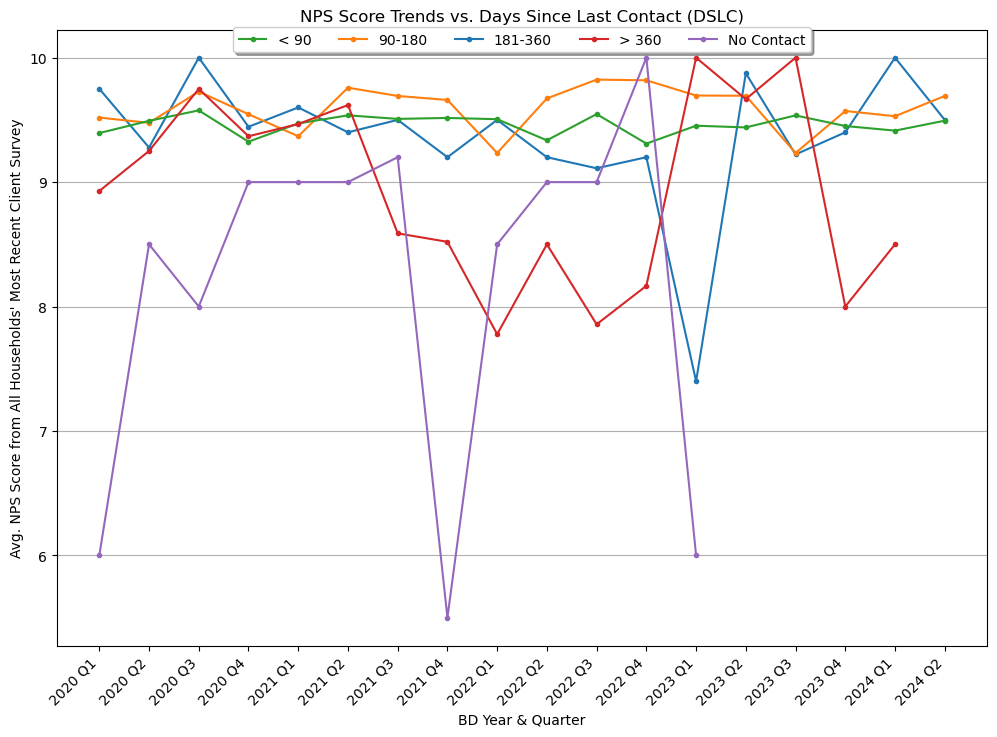

In [263]:
plotData(datadf = q2a_df, 
         groupbyvar = "DSLC_CATEGORY", 
         xvar = "BD_YYYY_QQ", 
         yvar = "LIKELY_TO_RECOMMEND", 
         intitle = 'NPS Score Trends vs. Days Since Last Contact (DSLC)', 
         inylabel = "Avg. NPS Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [2, 1, 0, 3, 4],
         legendcolor = [],
         exportpath = 'q2a_df.png', 
         saveyn = True)

In [264]:
# q2b DSLCR vs NPS Score
q2b_df = q2_df.groupby(['BD_YYYY_QQ', 'DSLCR_CATEGORY'], as_index = False)["LIKELY_TO_RECOMMEND"].mean()
q2b_df = q2b_df[q2b_df['BD_YYYY_QQ'] >= "2020 Q1"]

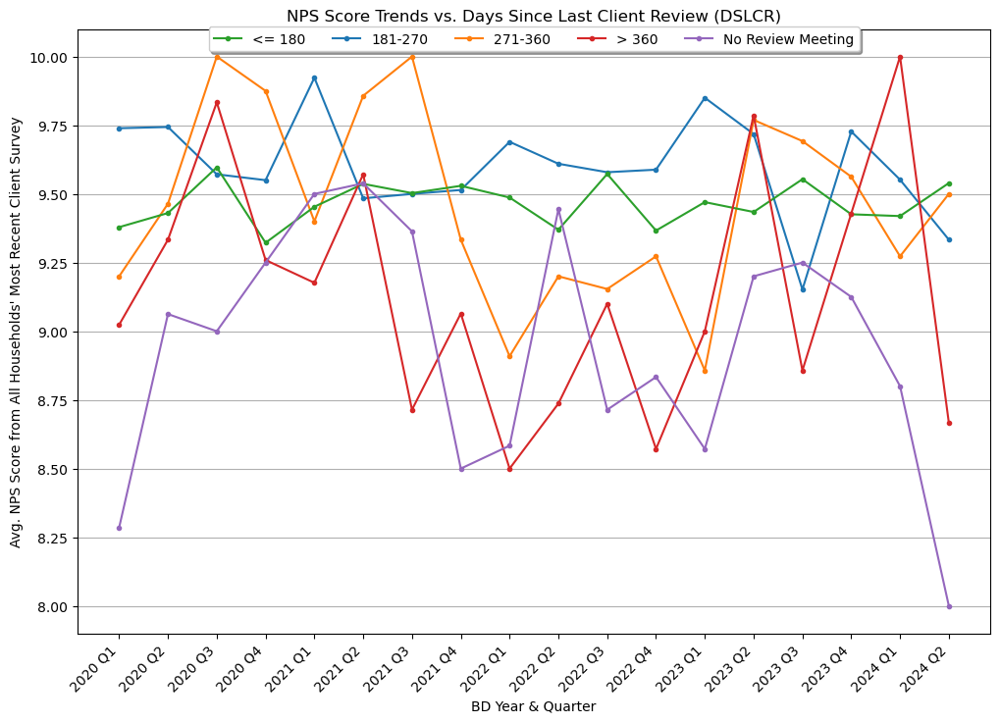

In [265]:
plotData(datadf = q2b_df, 
         groupbyvar = "DSLCR_CATEGORY", 
         xvar = "BD_YYYY_QQ", 
         yvar = "LIKELY_TO_RECOMMEND", 
         intitle = 'NPS Score Trends vs. Days Since Last Client Review (DSLCR)', 
         inylabel = "Avg. NPS Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [2, 0, 1, 3, 4],
         legendcolor = [],
         exportpath = 'q2b_df.png', 
         saveyn = True)

In [266]:
# q2c DSLC vs Trust Score
q2c_df = q2_df.groupby(['BD_YYYY_QQ', 'DSLC_CATEGORY'], as_index = False)["TRUST_SCORE_C"].mean()
q2c_df = q2c_df[q2c_df['BD_YYYY_QQ'] >= "2022 Q4"]

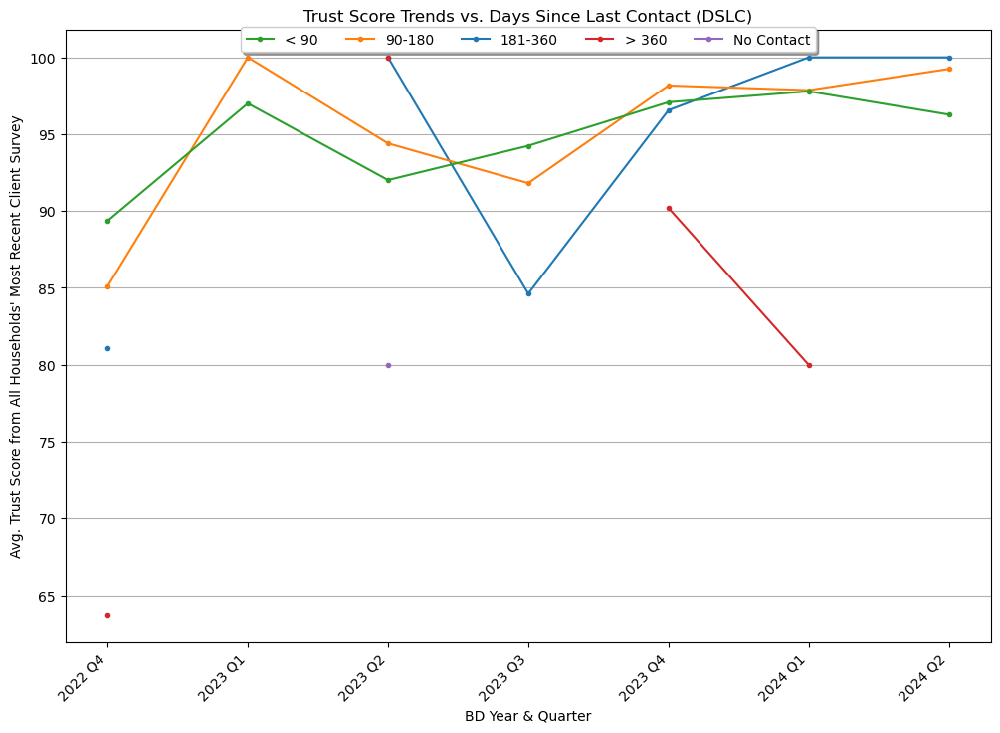

In [267]:
plotData(datadf = q2c_df, 
         groupbyvar = "DSLC_CATEGORY", 
         xvar = "BD_YYYY_QQ", 
         yvar = "TRUST_SCORE_C", 
         intitle = 'Trust Score Trends vs. Days Since Last Contact (DSLC)', 
         inylabel = "Avg. Trust Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [2, 1, 0, 3, 4],
         legendcolor = [],
         exportpath = 'q2c_df.png', 
         saveyn = True)

In [268]:
# q2d DSLCR vs Trust Score
q2d_df = q2_df.groupby(['BD_YYYY_QQ', 'DSLCR_CATEGORY'], as_index = False)["TRUST_SCORE_C"].mean()
q2d_df = q2d_df[q2d_df['BD_YYYY_QQ'] >= "2022 Q4"]

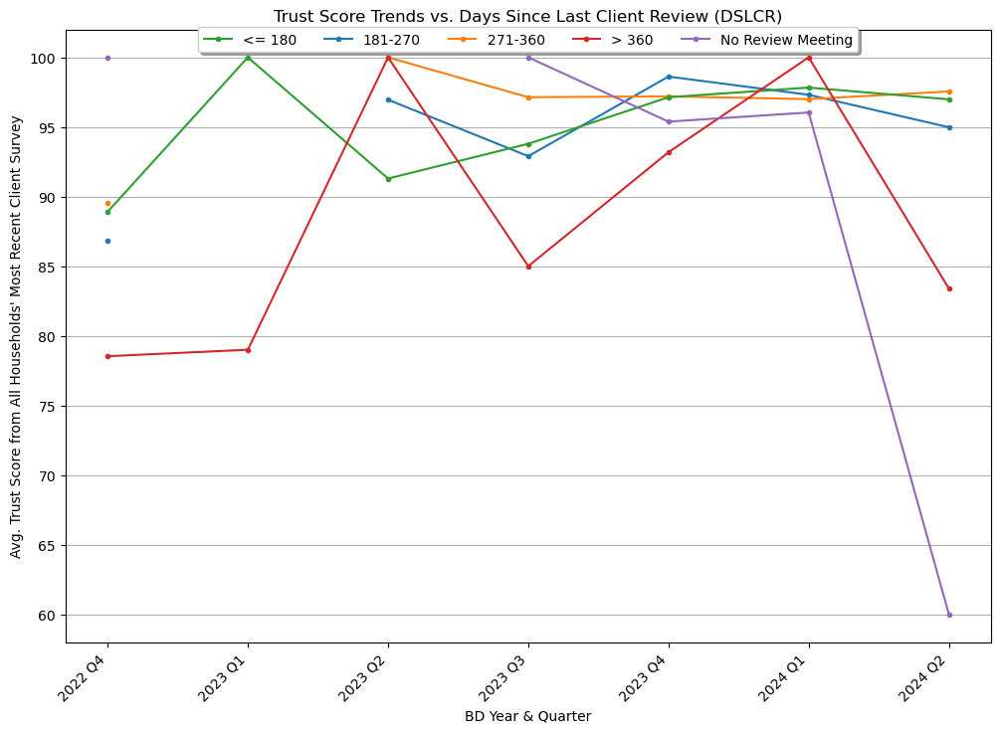

In [269]:
plotData(datadf = q2d_df, 
         groupbyvar = "DSLCR_CATEGORY", 
         xvar = "BD_YYYY_QQ", 
         yvar = "TRUST_SCORE_C", 
         intitle = 'Trust Score Trends vs. Days Since Last Client Review (DSLCR)', 
         inylabel = "Avg. Trust Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [2, 0, 1, 3, 4],
         legendcolor = [],
         exportpath = 'q2d_df.png', 
         saveyn = True)

In [270]:
# q2e DSLC vs Satisfaction Score
q2e_df = q2_df.groupby(['BD_YYYY_QQ', 'DSLC_CATEGORY'], as_index = False)["SATISFACTION_SCORE"].mean()
q2e_df = q2e_df[q2e_df['BD_YYYY_QQ'] >= "2020 Q1"]

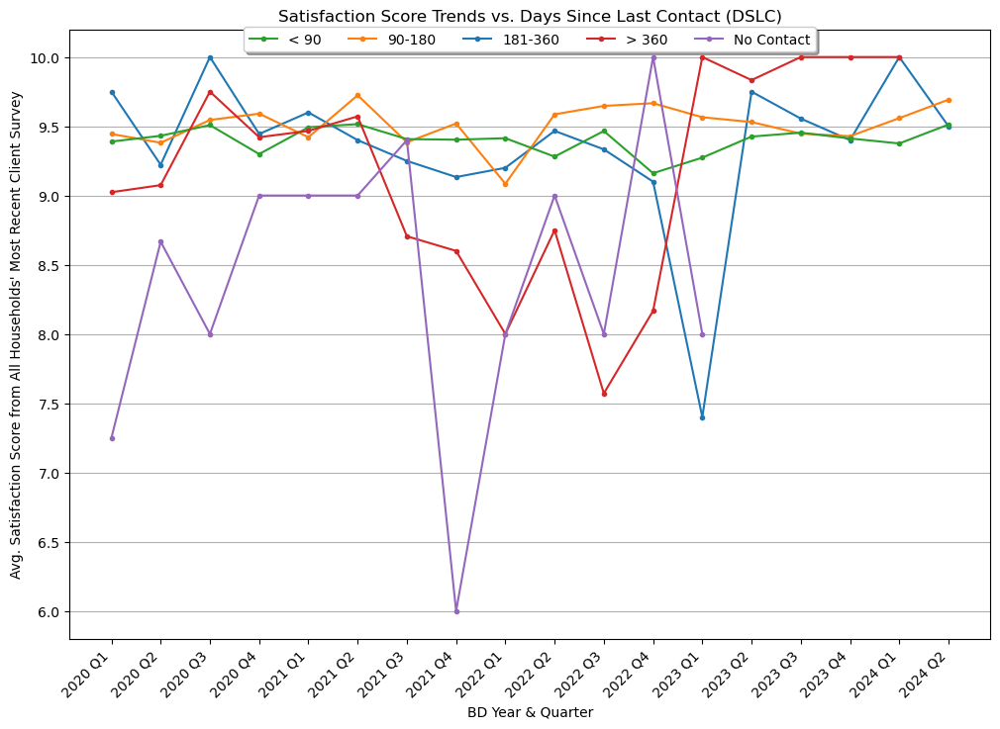

In [271]:
plotData(datadf = q2e_df, 
         groupbyvar = "DSLC_CATEGORY", 
         xvar = "BD_YYYY_QQ", 
         yvar = "SATISFACTION_SCORE", 
         intitle = 'Satisfaction Score Trends vs. Days Since Last Contact (DSLC)', 
         inylabel = "Avg. Satisfaction Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [2, 1, 0, 3, 4],
         legendcolor = [],
         exportpath = 'q2e_df.png', 
         saveyn = True)

In [272]:
# q2f DSLCR vs Satisfaction Score
q2f_df = q2_df.groupby(['BD_YYYY_QQ', 'DSLCR_CATEGORY'], as_index = False)["SATISFACTION_SCORE"].mean()
q2f_df = q2f_df[q2f_df['BD_YYYY_QQ'] >= "2020 Q1"]

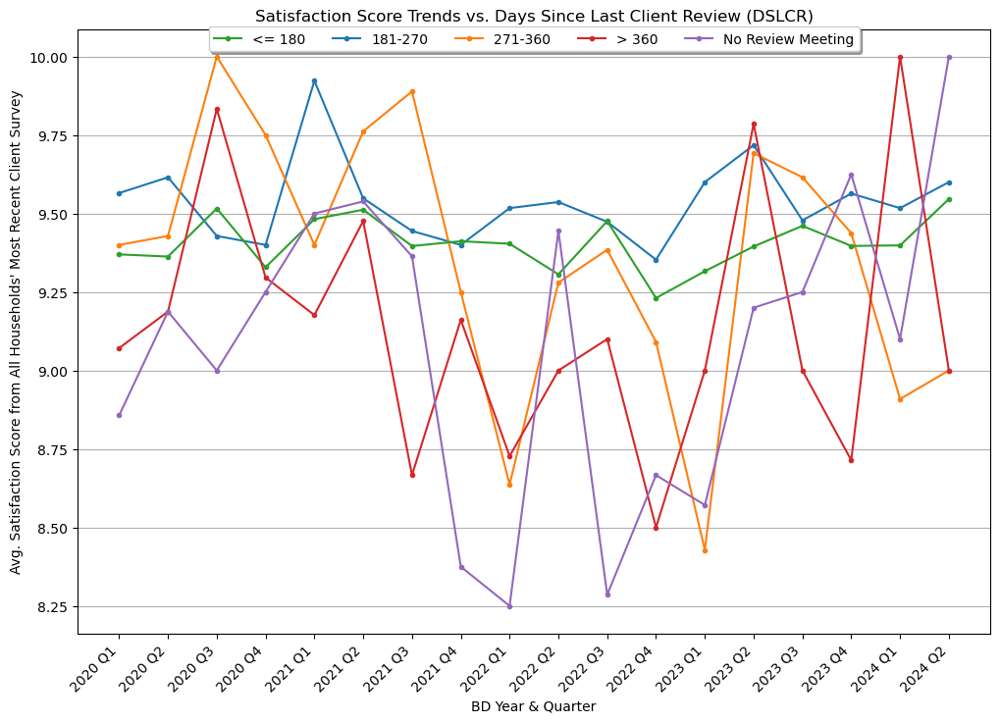

In [273]:
plotData(datadf = q2f_df, 
         groupbyvar = "DSLCR_CATEGORY", 
         xvar = "BD_YYYY_QQ", 
         yvar = "SATISFACTION_SCORE", 
         intitle = 'Satisfaction Score Trends vs. Days Since Last Client Review (DSLCR)', 
         inylabel = "Avg. Satisfaction Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [2, 0, 1, 3, 4],
         legendcolor = [],
         exportpath = 'q2f_df.png', 
         saveyn = True)

In [274]:
# Q3 Num of Lead LA Transitions 
team_mem_df = pd.read_csv("team_mem.csv")

In [275]:
# Limit Dataframe to only entries where there was a former lead advisor
team_mem_df = team_mem_df[team_mem_df["ROLE_STATUS_C"] == "Former"]
team_mem_df = team_mem_df[team_mem_df["TEAM_ROLE_C"] == "Lead Advisor"]

In [276]:
# For each household, look for the number of forer lead advisors based on the team member table
la_trans_df = hh_df[["ID"]].merge(team_mem_df, how = "left", left_on = "ID", right_on = "CLIENT_C")

In [277]:
la_trans_df

,ID,CLIENT_C,NAME,ROLE_STATUS_C,TEAM_ROLE_C
0,001RQ000004BZPxYAO,NaN,NaN,NaN,NaN
1,001RQ000004BWvAYAW,NaN,NaN,NaN,NaN
2,001RQ000002eGJRYA2,NaN,NaN,NaN,NaN
3,001RQ000002d6NpYAI,NaN,NaN,NaN,NaN
4,001RQ000001Lw3mYAC,NaN,NaN,NaN,NaN
...,...,...,...,...,...
25443,001E000001U3ovjIAB,001E000001U3ovjIAB,Member-12692,Former,Lead Advisor
25444,0012R00002A9MyMQAV,NaN,NaN,NaN,NaN
25445,001RQ000000vVQZYA2,NaN,NaN,NaN,NaN
25446,0014400001o7eS3AAI,NaN,NaN,NaN,NaN


In [278]:
# For each household, count the number of former lead advisors
la_summ_df = la_trans_df.groupby(["ID"], as_index = False)["CLIENT_C"].count()
la_summ_df.rename(columns = {"CLIENT_C": "Num_LA_Trans"}, inplace = True)

In [279]:
la_summ_df

,ID,Num_LA_Trans
0,0012R000024pYQNQA2,1
1,0012R000024pYV3QAM,1
2,0012R000024pYk1QAE,1
3,0012R000024pYkvQAE,0
4,0012R000024pYl5QAE,1
...,...,...
23154,001RQ000006gLfjYAE,0
23155,001RQ000006hwN9YAI,0
23156,001RQ000006i635YAA,0
23157,001RQ000006iDZCYA2,0


In [280]:
la_summ_df["Num_LA_Trans"].value_counts().to_csv("figures/q3.csv")

In [281]:
q3_df = clientsurv_df[["ACCOUNT_ID", "SURVEY_DATE", "TRUST_SCORE_C", "SATISFACTION_SCORE", "LIKELY_TO_RECOMMEND"]].merge(la_summ_df, how = "left", left_on = "ACCOUNT_ID", right_on = "ID")
q3_df["SURVEY_DATE"] = (pd.to_datetime(q3_df["SURVEY_DATE"])).dt.strftime('%Y-%m-%d')
q3_df = q3_df.merge(bd_cal_df[["ACTUAL_DATE", "BD_YYYY_QQ","BD_YEAR"]], how = "left", left_on = "SURVEY_DATE", right_on = "ACTUAL_DATE")

In [282]:
q3_df

,ACCOUNT_ID,SURVEY_DATE,TRUST_SCORE_C,SATISFACTION_SCORE,LIKELY_TO_RECOMMEND,ID,Num_LA_Trans,ACTUAL_DATE,BD_YYYY_QQ,BD_YEAR
0,001E000001UO6bdIAD,2021-05-19,NaN,10.0,10.0,001E000001UO6bdIAD,0,2021-05-19,2021 Q3,2021
1,001E000000dUhMbIAK,2021-05-19,NaN,9.0,10.0,001E000000dUhMbIAK,0,2021-05-19,2021 Q3,2021
2,001E000001U3ovjIAB,2021-05-19,NaN,10.0,10.0,001E000001U3ovjIAB,1,2021-05-19,2021 Q3,2021
3,0012R00002981oAQAQ,2021-05-19,NaN,8.0,8.0,0012R00002981oAQAQ,1,2021-05-19,2021 Q3,2021
4,0012R000027laCzQAI,2021-05-19,NaN,10.0,10.0,0012R000027laCzQAI,1,2021-05-19,2021 Q3,2021
...,...,...,...,...,...,...,...,...,...,...
9375,001E000001ROb9eIAD,2021-05-19,NaN,10.0,9.0,001E000001ROb9eIAD,4,2021-05-19,2021 Q3,2021
9376,001E000000dUhT9IAK,2021-05-19,NaN,9.0,10.0,001E000000dUhT9IAK,1,2021-05-19,2021 Q3,2021
9377,001E000000dUhCJIA0,2021-05-19,NaN,10.0,10.0,001E000000dUhCJIA0,1,2021-05-19,2021 Q3,2021
9378,0012R00002BoEGPQA3,2021-05-19,NaN,10.0,10.0,0012R00002BoEGPQA3,2,2021-05-19,2021 Q3,2021


In [283]:
# Q3a: LA Transitions vs NPS
q3a_df = q3_df.groupby(["BD_YYYY_QQ", 'Num_LA_Trans'], as_index = False)["LIKELY_TO_RECOMMEND"].mean()
q3a_df = q3a_df[q3a_df["BD_YYYY_QQ"] >= "2020 Q1"]

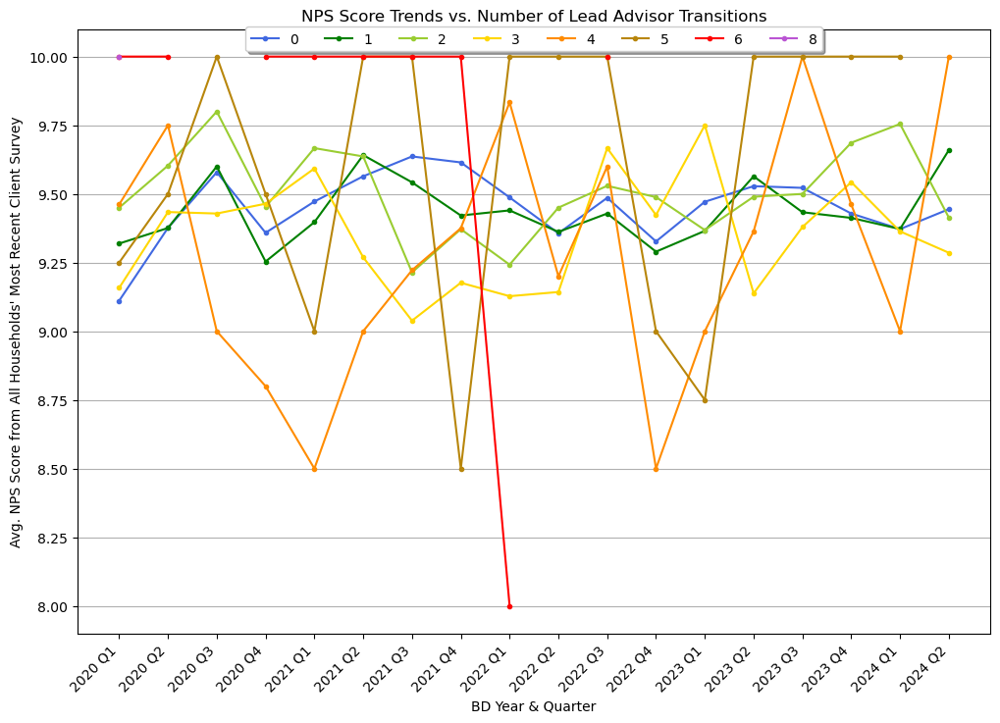

In [284]:
plotData(datadf = q3a_df, 
         groupbyvar = 'Num_LA_Trans', 
         xvar = "BD_YYYY_QQ", 
         yvar = "LIKELY_TO_RECOMMEND", 
         intitle = 'NPS Score Trends vs. Number of Lead Advisor Transitions', 
         inylabel = "Avg. NPS Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = ["royalblue", "green","yellowgreen","gold","darkorange", "darkgoldenrod","red","mediumorchid"],
         exportpath = 'q3a_df.png', 
         saveyn = True)

In [285]:
# Q3b: LA Transitions vs Trust Score
q3b_df = q3_df.groupby(["BD_YYYY_QQ", 'Num_LA_Trans'], as_index = False)["TRUST_SCORE_C"].mean()
q3b_df = q3b_df[q3b_df["BD_YYYY_QQ"] >= "2022 Q3"]

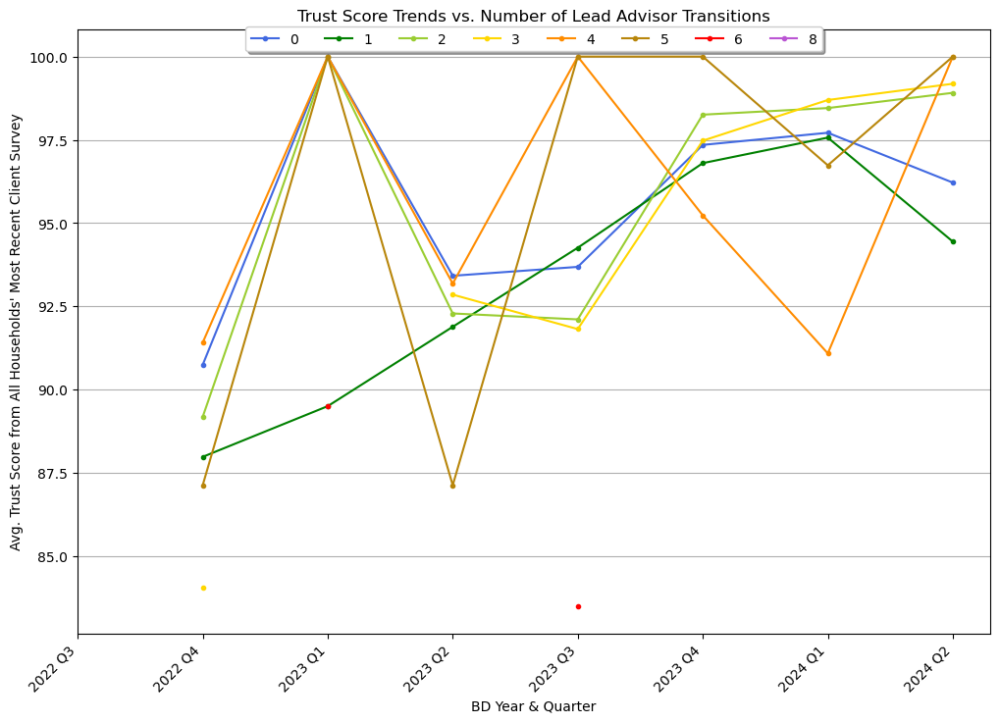

In [286]:
plotData(datadf = q3b_df, 
         groupbyvar = 'Num_LA_Trans', 
         xvar = "BD_YYYY_QQ", 
         yvar = "TRUST_SCORE_C", 
         intitle = 'Trust Score Trends vs. Number of Lead Advisor Transitions', 
         inylabel = "Avg. Trust Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = ["royalblue", "green","yellowgreen","gold","darkorange", "darkgoldenrod","red","mediumorchid"],
         exportpath = 'q3b_df.png', 
         saveyn = True)

In [287]:
# Q3c: LA Transitions vs Satisfaction Score
q3c_df = q3_df.groupby(["BD_YYYY_QQ", 'Num_LA_Trans'], as_index = False)["SATISFACTION_SCORE"].mean()
q3c_df = q3c_df[q3c_df["BD_YYYY_QQ"] >= "2020 Q1"]

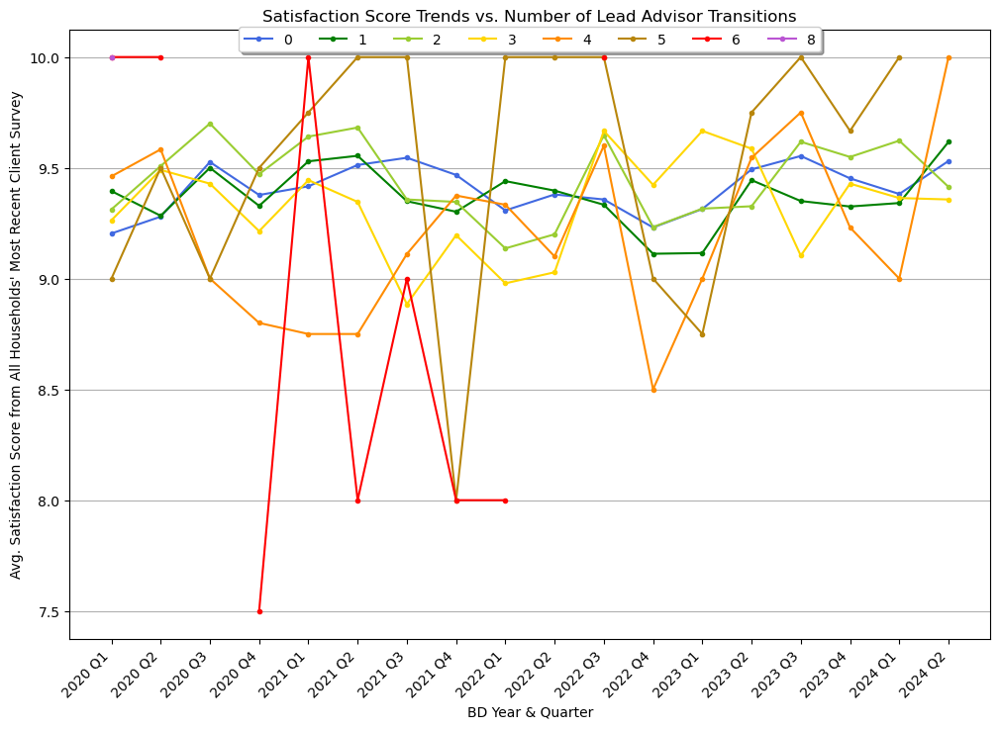

In [288]:
plotData(datadf = q3c_df, 
         groupbyvar = 'Num_LA_Trans', 
         xvar = "BD_YYYY_QQ", 
         yvar = "SATISFACTION_SCORE", 
         intitle = 'Satisfaction Score Trends vs. Number of Lead Advisor Transitions', 
         inylabel = "Avg. Satisfaction Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [],
         legendcolor = ["royalblue", "green","yellowgreen","gold","darkorange", "darkgoldenrod","red","mediumorchid"],
         exportpath = 'q3c_df.png', 
         saveyn = True)

In [289]:
# Q4: KC vs Client Engagement Rank
q4_df = clientsurv_df.merge(hh_df, how = "left", left_on = "ACCOUNT_ID", right_on = "ID")
q4_df = q4_df[["ACCOUNT_ID", "SURVEY_DATE", "TRUST_SCORE_C", "SATISFACTION_SCORE", "LIKELY_TO_RECOMMEND", "CLIENT_ENGAGEMENT_RANK_C"]]
q4_df["SURVEY_DATE"] = (pd.to_datetime(q4_df["SURVEY_DATE"])).dt.strftime('%Y-%m-%d')
q4_df = q4_df.merge(bd_cal_df[["ACTUAL_DATE", "BD_YEAR", "BD_YYYY_QQ"]], how = "left", left_on = "SURVEY_DATE", right_on = "ACTUAL_DATE")

In [290]:
q4_df

,ACCOUNT_ID,SURVEY_DATE,TRUST_SCORE_C,SATISFACTION_SCORE,LIKELY_TO_RECOMMEND,CLIENT_ENGAGEMENT_RANK_C,ACTUAL_DATE,BD_YEAR,BD_YYYY_QQ
0,001E000001UO6bdIAD,2021-05-19,NaN,10.0,10.0,Green,2021-05-19,2021,2021 Q3
1,001E000000dUhMbIAK,2021-05-19,NaN,9.0,10.0,Green,2021-05-19,2021,2021 Q3
2,001E000001U3ovjIAB,2021-05-19,NaN,10.0,10.0,Green,2021-05-19,2021,2021 Q3
3,0012R00002981oAQAQ,2021-05-19,NaN,8.0,8.0,Green,2021-05-19,2021,2021 Q3
4,0012R000027laCzQAI,2021-05-19,NaN,10.0,10.0,Green,2021-05-19,2021,2021 Q3
...,...,...,...,...,...,...,...,...,...
9375,001E000001ROb9eIAD,2021-05-19,NaN,10.0,9.0,Green,2021-05-19,2021,2021 Q3
9376,001E000000dUhT9IAK,2021-05-19,NaN,9.0,10.0,Green,2021-05-19,2021,2021 Q3
9377,001E000000dUhCJIA0,2021-05-19,NaN,10.0,10.0,Green,2021-05-19,2021,2021 Q3
9378,0012R00002BoEGPQA3,2021-05-19,NaN,10.0,10.0,Green,2021-05-19,2021,2021 Q3


In [291]:
# q4a: Analyze NPS Score by RAR
q4a_df = q4_df.groupby(['BD_YYYY_QQ', 'CLIENT_ENGAGEMENT_RANK_C'], as_index = False)["LIKELY_TO_RECOMMEND"].mean()
q4a_df = q4a_df[q4a_df["BD_YYYY_QQ"] >= "2020 Q1"]

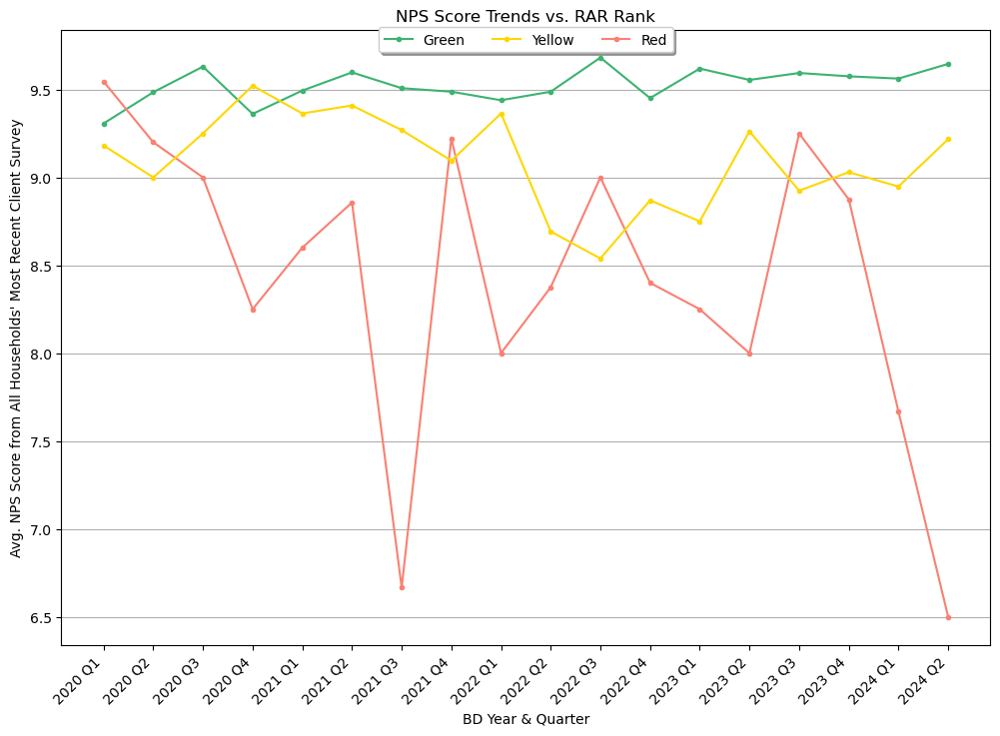

In [292]:
plotData(datadf = q4a_df, 
         groupbyvar = "CLIENT_ENGAGEMENT_RANK_C", 
         xvar = "BD_YYYY_QQ", 
         yvar = "LIKELY_TO_RECOMMEND", 
         intitle = 'NPS Score Trends vs. RAR Rank', 
         inylabel = "Avg. NPS Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [0, 2, 1],
         legendcolor = ["mediumseagreen", "salmon", "gold"],
         exportpath = 'q4a_df.png', 
         saveyn = True)

In [293]:
# q4b: Analyze Trust Score by RAR
q4b_df = q4_df.groupby(['BD_YYYY_QQ', 'CLIENT_ENGAGEMENT_RANK_C'], as_index = False)["TRUST_SCORE_C"].mean()
q4b_df = q4b_df[q4b_df["BD_YYYY_QQ"] >= "2022 Q4"]

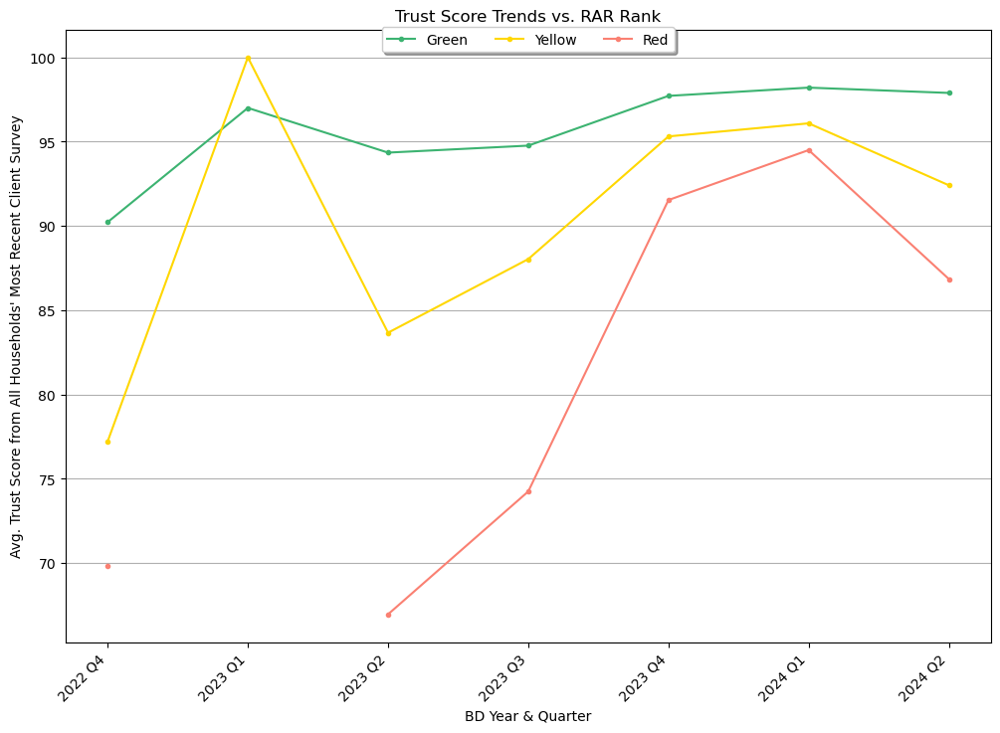

In [294]:
plotData(datadf = q4b_df, 
         groupbyvar = "CLIENT_ENGAGEMENT_RANK_C", 
         xvar = "BD_YYYY_QQ", 
         yvar = "TRUST_SCORE_C", 
         intitle = 'Trust Score Trends vs. RAR Rank', 
         inylabel = "Avg. Trust Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [0, 2, 1],
         legendcolor = ["mediumseagreen", "salmon", "gold"],
         exportpath = 'q4b_df.png', 
         saveyn = True)

In [295]:
# q4c: Analyze Satisfaction Score by RAR
q4c_df = q4_df.groupby(['BD_YYYY_QQ', 'CLIENT_ENGAGEMENT_RANK_C'], as_index = False)["SATISFACTION_SCORE"].mean()
q4c_df = q4c_df[q4c_df["BD_YYYY_QQ"] >= "2020 Q1"]

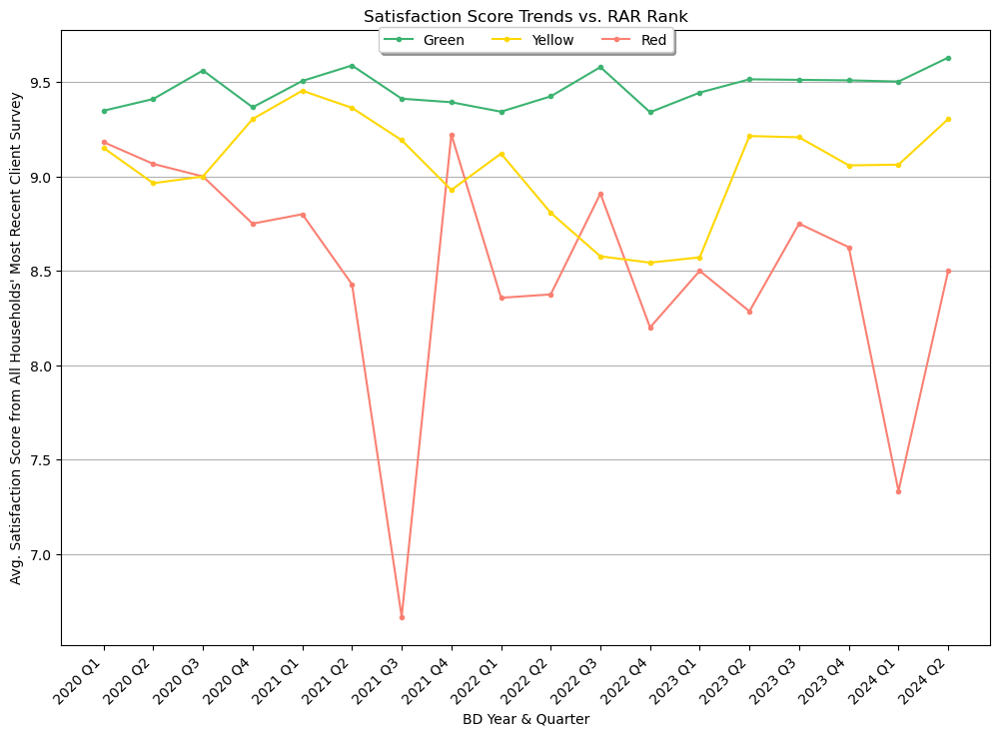

In [296]:
plotData(datadf = q4c_df, 
         groupbyvar = "CLIENT_ENGAGEMENT_RANK_C", 
         xvar = "BD_YYYY_QQ", 
         yvar = "SATISFACTION_SCORE", 
         intitle = 'Satisfaction Score Trends vs. RAR Rank', 
         inylabel = "Avg. Satisfaction Score from All Households' Most Recent Client Survey", 
         inxlabel = 'BD Year & Quarter', 
         legendorder = [0, 2, 1],
         legendcolor = ["mediumseagreen", "salmon", "gold"],
         exportpath = 'q4c_df.png', 
         saveyn = True)

In [297]:
# Q5: DSLC(R) Categories vs RAR Distribution
q5_df = clientsurv_df.merge(hh_df, how = "left", left_on = "ACCOUNT_ID", right_on = "ID")
q5_df = q5_df[["ACCOUNT_ID", "SURVEY_DATE", "DSLC_CATEGORY", "DSLCR_CATEGORY","CLIENT_ENGAGEMENT_RANK_C"]]
q5_df["SURVEY_DATE"] = (pd.to_datetime(q5_df["SURVEY_DATE"])).dt.strftime('%Y-%m-%d')
q5_df = q5_df.merge(bd_cal_df[["ACTUAL_DATE", "BD_YEAR", "BD_YYYY_QQ"]], how = "left", left_on = "SURVEY_DATE", right_on = "ACTUAL_DATE")
q5_df = q5_df[q5_df["BD_YEAR"] >= 2022]

In [298]:
q5_df

,ACCOUNT_ID,SURVEY_DATE,DSLC_CATEGORY,DSLCR_CATEGORY,CLIENT_ENGAGEMENT_RANK_C,ACTUAL_DATE,BD_YEAR,BD_YYYY_QQ
4692,0012R00002LMVHrQAP,2024-02-04,< 90,<= 180,Yellow,2024-02-04,2024,2024 Q2
4693,0012R00002L1i7zQAB,2024-02-04,< 90,<= 180,Yellow,2024-02-04,2024,2024 Q2
4694,0012R00002KQEPWQA5,2024-02-04,< 90,<= 180,Yellow,2024-02-04,2024,2024 Q2
4695,0012R00002HWhbEQAT,2024-02-04,> 360,> 360,Green,2024-02-04,2024,2024 Q2
4696,001E000000dUhUjIAK,2024-02-04,< 90,<= 180,Green,2024-02-04,2024,2024 Q2
...,...,...,...,...,...,...,...,...
8175,0014400001qVOkPAAW,2021-10-01,181-360,No Review Meeting,Green,2021-10-01,2022,2022 Q1
8176,0012R00002DMrmBQAT,2021-10-01,181-360,181-270,Green,2021-10-01,2022,2022 Q1
8177,001E000001HuXdhIAF,2021-10-01,< 90,<= 180,Green,2021-10-01,2022,2022 Q1
8178,0012R000029qX5GQAU,2021-10-01,< 90,271-360,Green,2021-10-01,2022,2022 Q1


In [299]:
# Plan to Compare 2022-2024
q5_2022_df = q5_df[q5_df["BD_YEAR"] == 2022]
q5_2023_df = q5_df[q5_df["BD_YEAR"] == 2023]
q5_2024_df = q5_df[q5_df["BD_YEAR"] == 2024]

2022

In [300]:
# 2022 DSLC
q5_dslc_2022 = pd.crosstab(q5_2022_df["DSLC_CATEGORY"], q5_2022_df ['CLIENT_ENGAGEMENT_RANK_C'], dropna = False).reset_index()
q5_dslc_2022 = q5_dslc_2022.set_index('DSLC_CATEGORY')
q5_dslc_2022 = q5_dslc_2022[["Green", "Yellow", "Red"]]
q5_dslc_2022["Total Surveys"] = q5_dslc_2022["Green"] + q5_dslc_2022["Red"] + q5_dslc_2022["Yellow"]
q5_dslc_2022 = q5_dslc_2022.reindex(dslc_order_list)

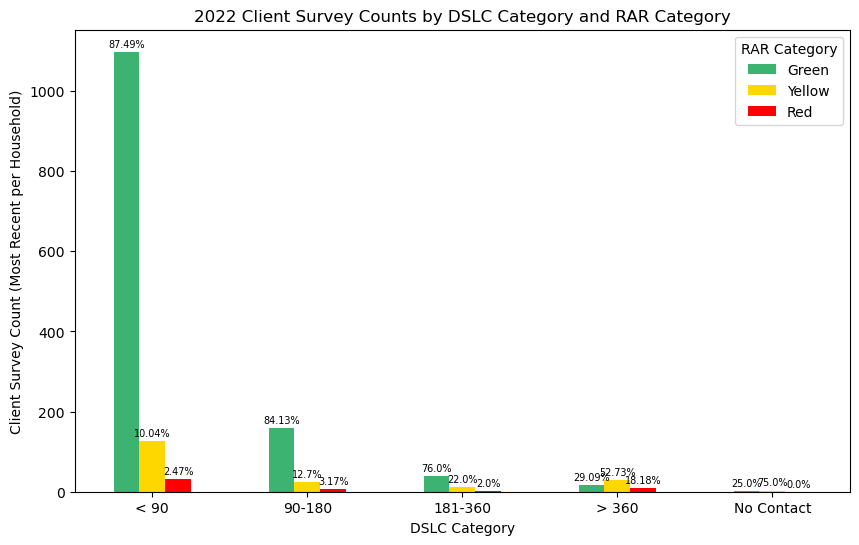

In [301]:
# calculate the percent for each row
per = q5_dslc_2022.iloc[:, :-1].div(q5_dslc_2022['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = q5_dslc_2022.iloc[:, :-1].plot(kind='bar', stacked=False, figsize=(10, 6), rot=0, color = ['mediumseagreen', 'gold', 'red'])
ax.legend(loc='upper right', title = "RAR Category")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "2022 Client Survey Counts by DSLC Category and RAR Category",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "DSLC Category")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = per[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='edge', fontsize=7, padding = 2)

plt.savefig('figures/q5_dslc_2022.png')

In [302]:
# 2022 DSLCR
q5_dslcr_2022 = pd.crosstab(q5_2022_df ["DSLCR_CATEGORY"], q5_2022_df ['CLIENT_ENGAGEMENT_RANK_C'], dropna = False).reset_index()
q5_dslcr_2022 = q5_dslcr_2022.set_index('DSLCR_CATEGORY')
q5_dslcr_2022 = q5_dslcr_2022[["Green", "Yellow", "Red"]]
q5_dslcr_2022["Total Surveys"] = q5_dslcr_2022["Green"] + q5_dslcr_2022["Red"] + q5_dslcr_2022["Yellow"]
q5_dslcr_2022 = q5_dslcr_2022.reindex(dslcr_order_list)

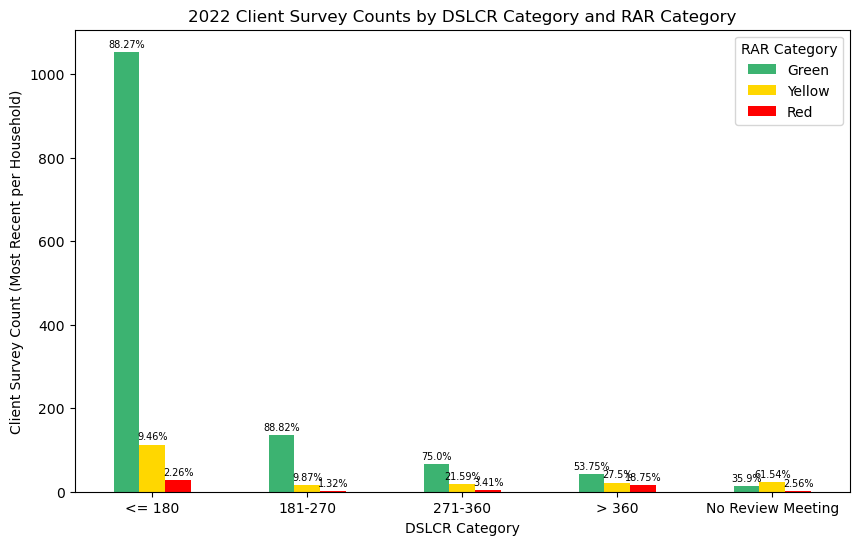

In [303]:
# calculate the percent for each row
per = q5_dslcr_2022.iloc[:, :-1].div(q5_dslcr_2022['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = q5_dslcr_2022.iloc[:, :-1].plot(kind='bar', stacked=False, figsize=(10, 6), rot=0, color = ['mediumseagreen', 'gold', 'red'])
ax.legend(loc='upper right', title = "RAR Category")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "2022 Client Survey Counts by DSLCR Category and RAR Category",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "DSLCR Category")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = per[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='edge', fontsize=7, padding = 2)

plt.savefig('figures/q5_dslcr_2022.png')

2023

In [304]:
# 2023 DSLC
q5_dslc_2023 = pd.crosstab(q5_2023_df["DSLC_CATEGORY"], q5_2023_df['CLIENT_ENGAGEMENT_RANK_C'], dropna = False).reset_index()
q5_dslc_2023 = q5_dslc_2023.set_index('DSLC_CATEGORY')
q5_dslc_2023 = q5_dslc_2023[["Green", "Yellow", "Red"]]
q5_dslc_2023["Total Surveys"] = q5_dslc_2023["Green"] + q5_dslc_2023["Red"] + q5_dslc_2023["Yellow"]
q5_dslc_2023 = q5_dslc_2023.reindex(dslc_order_list)

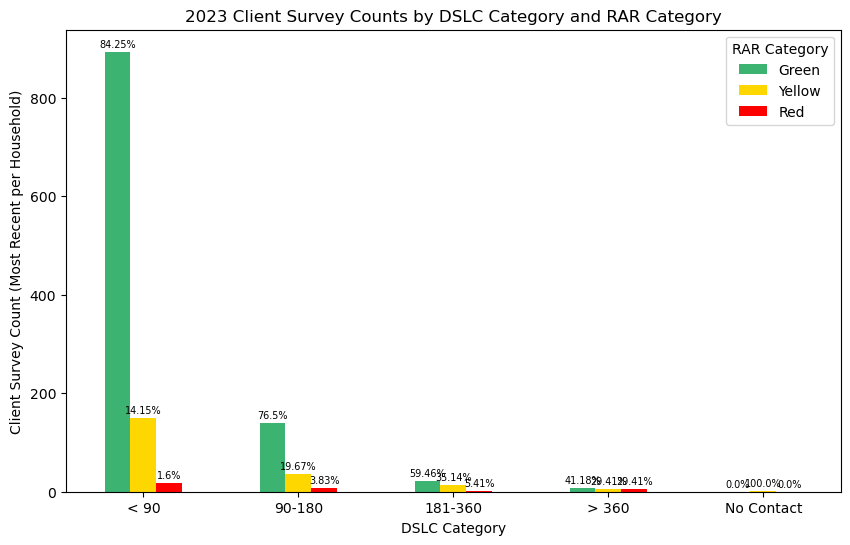

In [305]:
# calculate the percent for each row
per = q5_dslc_2023.iloc[:, :-1].div(q5_dslc_2023['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = q5_dslc_2023.iloc[:, :-1].plot(kind='bar', stacked=False, figsize=(10, 6), rot=0, color = ['mediumseagreen', 'gold', 'red'])
ax.legend(loc='upper right', title = "RAR Category")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "2023 Client Survey Counts by DSLC Category and RAR Category",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "DSLC Category")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = per[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='edge', fontsize=7, padding = 2)

plt.savefig('figures/q5_dslc_2023.png')

In [306]:
# 2023 DSLCR
q5_dslcr_2023 = pd.crosstab(q5_2023_df ["DSLCR_CATEGORY"], q5_2023_df['CLIENT_ENGAGEMENT_RANK_C'], dropna = False).reset_index()
q5_dslcr_2023 = q5_dslcr_2023.set_index('DSLCR_CATEGORY')
q5_dslcr_2023 = q5_dslcr_2023[["Green", "Yellow", "Red"]]
q5_dslcr_2023["Total Surveys"] = q5_dslcr_2023["Green"] + q5_dslcr_2023["Red"] + q5_dslcr_2023["Yellow"]
q5_dslcr_2023 = q5_dslcr_2023.reindex(dslcr_order_list)

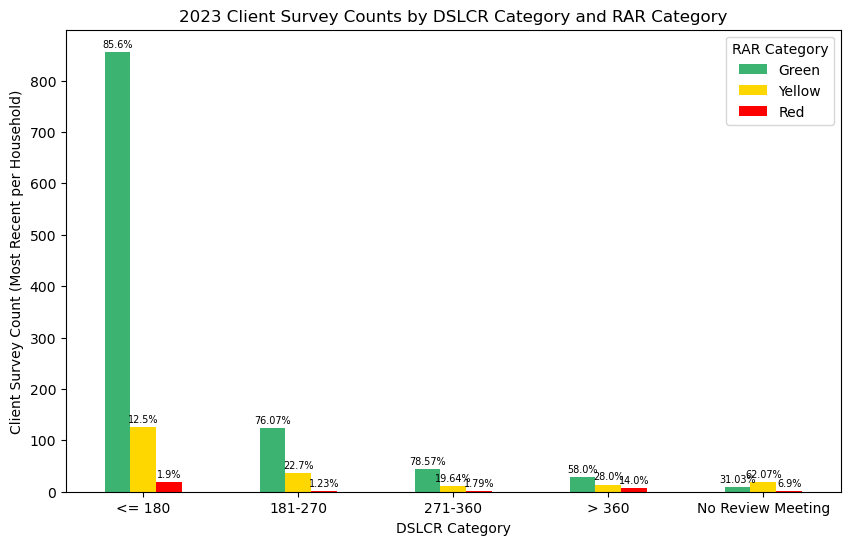

In [307]:
# calculate the percent for each row
per = q5_dslcr_2023.iloc[:, :-1].div(q5_dslcr_2023['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = q5_dslcr_2023.iloc[:, :-1].plot(kind='bar', stacked=False, figsize=(10, 6), rot=0, color = ['mediumseagreen', 'gold', 'red'])
ax.legend(loc='upper right', title = "RAR Category")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "2023 Client Survey Counts by DSLCR Category and RAR Category",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "DSLCR Category")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = per[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='edge', fontsize=7, padding = 2)

plt.savefig('figures/q5_dslcr_2023.png')

2024

In [308]:
# 2024 DSLC
q5_dslc_2024 = pd.crosstab(q5_2024_df["DSLC_CATEGORY"], q5_2024_df['CLIENT_ENGAGEMENT_RANK_C'], dropna = False).reset_index()
q5_dslc_2024 = q5_dslc_2024.set_index('DSLC_CATEGORY')
q5_dslc_2024 = q5_dslc_2024[["Green", "Yellow", "Red"]]
q5_dslc_2024["Total Surveys"] = q5_dslc_2024["Green"] + q5_dslc_2024["Red"] + q5_dslc_2024["Yellow"]
q5_dslc_2024 = q5_dslc_2024.reindex(dslc_order_list)

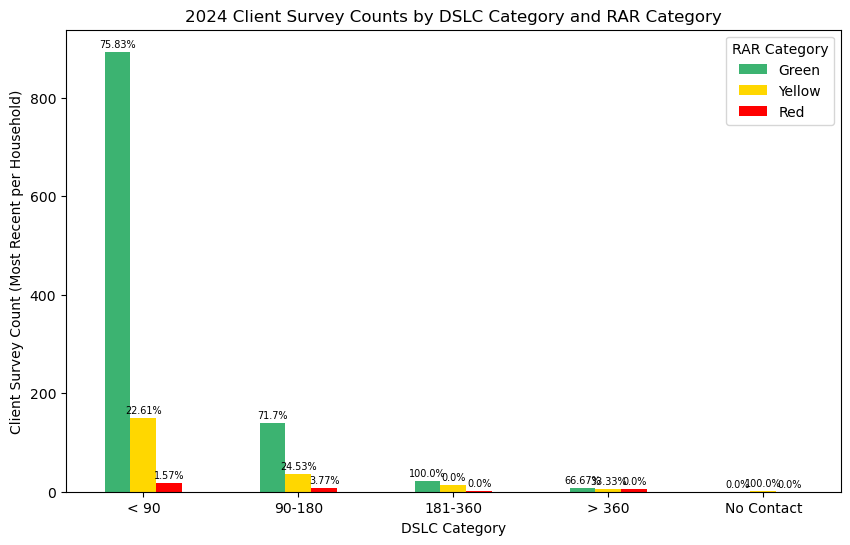

In [309]:
# calculate the percent for each row
per = q5_dslc_2024.iloc[:, :-1].div(q5_dslc_2024['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = q5_dslc_2023.iloc[:, :-1].plot(kind='bar', stacked=False, figsize=(10, 6), rot=0, color = ['mediumseagreen', 'gold', 'red'])
ax.legend(loc='upper right', title = "RAR Category")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "2024 Client Survey Counts by DSLC Category and RAR Category",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "DSLC Category")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = per[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='edge', fontsize=7, padding = 2)

plt.savefig('figures/q5_dslc_2024.png')

In [310]:
# 2024 DSLCR
q5_dslcr_2024 = pd.crosstab(q5_2024_df["DSLCR_CATEGORY"], q5_2024_df['CLIENT_ENGAGEMENT_RANK_C'], dropna = False).reset_index()
q5_dslcr_2024 = q5_dslcr_2024.set_index('DSLCR_CATEGORY')
q5_dslcr_2024 = q5_dslcr_2024[["Green", "Yellow", "Red"]]
q5_dslcr_2024["Total Surveys"] = q5_dslcr_2024["Green"] + q5_dslcr_2024["Red"] + q5_dslcr_2024["Yellow"]
q5_dslcr_2024 = q5_dslcr_2024.reindex(dslcr_order_list)

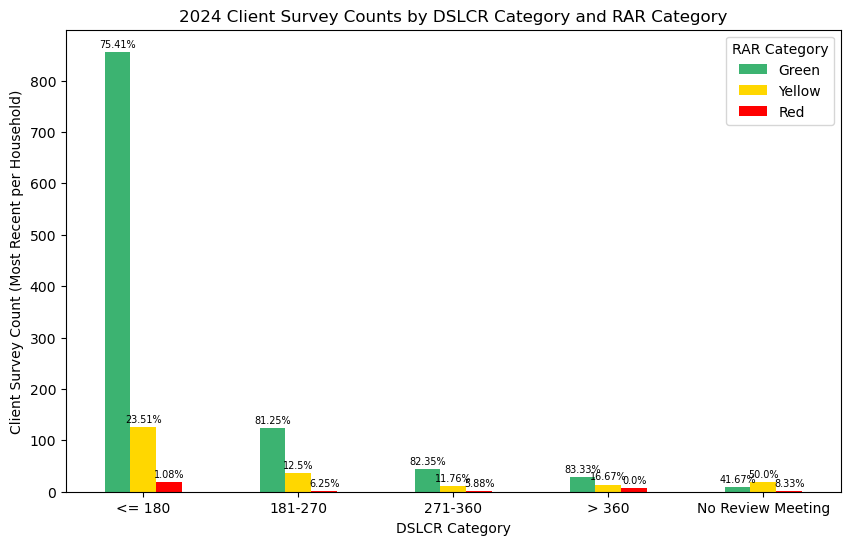

In [311]:
# calculate the percent for each row
per = q5_dslcr_2024.iloc[:, :-1].div(q5_dslcr_2024['Total Surveys'], axis=0).mul(100).round(2)

# Plot Bar Graph with Color Palette
ax = q5_dslcr_2023.iloc[:, :-1].plot(kind='bar', stacked=False, figsize=(10, 6), rot=0, color = ['mediumseagreen', 'gold', 'red'])
ax.legend(loc='upper right', title = "RAR Category")
# Set Graph Elements (Title, Axis Labels)
ax.set(title= "2024 Client Survey Counts by DSLCR Category and RAR Category",  #Set a title and x-and y-axis labels
            ylabel= "Client Survey Count (Most Recent per Household)", 
            xlabel= "DSLCR Category")
# iterate through the containers
for c in ax.containers:
    
    # get the current segment label (a string); corresponds to column / legend
    label = c.get_label()
    
    # create custom labels with percent
    labels = per[label].astype(str) + '%'
    
    # add the annotation
    ax.bar_label(c, labels=labels, label_type='edge', fontsize=7, padding = 2)

plt.savefig('figures/q5_dslcr_2024.png')

In [312]:
# Q6: Word bubble Charts per 1. client engagement rank, NPS Category 2. What keeps you here, where needs to improve since 2022
q6_df = clientsurv_df.merge(hh_df, how = "left", left_on = "ACCOUNT_ID", right_on = "ID")
q6_df = q6_df[["ACCOUNT_ID", "SURVEY_DATE", "LIKELY_TO_RECOMMEND", "CLIENT_ENGAGEMENT_RANK_C", "SURVEY_ID"]]
q6_df["SURVEY_DATE"] = (pd.to_datetime(q6_df["SURVEY_DATE"])).dt.strftime('%Y-%m-%d')
q6_df= q6_df.merge(bd_cal_df[["ACTUAL_DATE", "BD_YEAR", "BD_YYYY_QQ"]], how = "left", left_on = "SURVEY_DATE", right_on = "ACTUAL_DATE")
q6_df = q6_df[q6_df["BD_YEAR"] >= 2022]
q6_df['NPS_CATEGORY'] = np.select(conditions, results)
q6_df = q6_df.merge(clientsurv_more_df, how = "left", left_on = "SURVEY_ID", right_on = "ID")
q6_df.rename(columns = {"X_2016_Q_7_C": "WHAT_KEEPS_HERE", "X_2016_Q_4_C": "WHERE_IMPROVE"}, inplace = True)

In [313]:
q6_df

,ACCOUNT_ID,SURVEY_DATE,LIKELY_TO_RECOMMEND,CLIENT_ENGAGEMENT_RANK_C,SURVEY_ID,ACTUAL_DATE,BD_YEAR,BD_YYYY_QQ,NPS_CATEGORY,ID,WHAT_KEEPS_HERE,WHERE_IMPROVE
0,0012R00002LMVHrQAP,2024-02-04,10.0,Yellow,a00RQ000006N2P6YAK,2024-02-04,2024,2024 Q2,Promoters (9-10),a00RQ000006N2P6YAK,NaN,None of these
1,0012R00002L1i7zQAB,2024-02-04,10.0,Yellow,a00RQ000006MybaYAC,2024-02-04,2024,2024 Q2,Promoters (9-10),a00RQ000006MybaYAC,Trust and experience.,NaN
2,0012R00002KQEPWQA5,2024-02-04,10.0,Yellow,a00RQ000006MubCYAS,2024-02-04,2024,2024 Q2,Promoters (9-10),a00RQ000006MubCYAS,NaN,None of these
3,0012R00002HWhbEQAT,2024-02-04,9.0,Green,a00RQ000006McknYAC,2024-02-04,2024,2024 Q2,Promoters (9-10),a00RQ000006McknYAC,NaN,NaN
4,001E000000dUhUjIAK,2024-02-04,8.0,Green,a00RQ000006MaW1YAK,2024-02-04,2024,2024 Q2,Passives (7-8),a00RQ000006MaW1YAK,"No problems, collaborative, inertia",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
3483,0014400001qVOkPAAW,2021-10-01,NaN,Green,a002R00000ZBs7SQAT,2021-10-01,2022,2022 Q1,0,a002R00000ZBs7SQAT,NaN,NaN
3484,0012R00002DMrmBQAT,2021-10-01,10.0,Green,a002R00000ZBriNQAT,2021-10-01,2022,2022 Q1,Promoters (9-10),a002R00000ZBriNQAT,NaN,NaN
3485,001E000001HuXdhIAF,2021-10-01,8.0,Green,a002R00000ZBrWCQA1,2021-10-01,2022,2022 Q1,Passives (7-8),a002R00000ZBrWCQA1,Good follow-up. Solid rationale behind our go...,NaN
3486,0012R000029qX5GQAU,2021-10-01,9.0,Green,a002R00000ZBrThQAL,2021-10-01,2022,2022 Q1,Promoters (9-10),a002R00000ZBrThQAL,NaN,NaN


In [331]:
# Generate Wordcloud Function
def createWordcloud(datadf, textcol, savefigname):
    datadf.dropna(subset=[textcol], inplace = True)
    datadf[textcol] = datadf[textcol].astype(str)
    Text = " ".join(i for i in datadf[textcol])
    stopwords = set(wc.STOPWORDS)
    wordcloud = wc.WordCloud(stopwords=stopwords, background_color="white").generate(Text)
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    if savefigname != "":
        wordcloud.to_file("figures/" + savefigname)

In [332]:
#q6a: RAR, what keeps since 2022
q6a_g_df = q6_df[q6_df["CLIENT_ENGAGEMENT_RANK_C"] == "Green"]
q6a_y_df = q6_df[q6_df["CLIENT_ENGAGEMENT_RANK_C"] == "Yellow"]
q6a_r_df = q6_df[q6_df["CLIENT_ENGAGEMENT_RANK_C"] == "Red"]

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


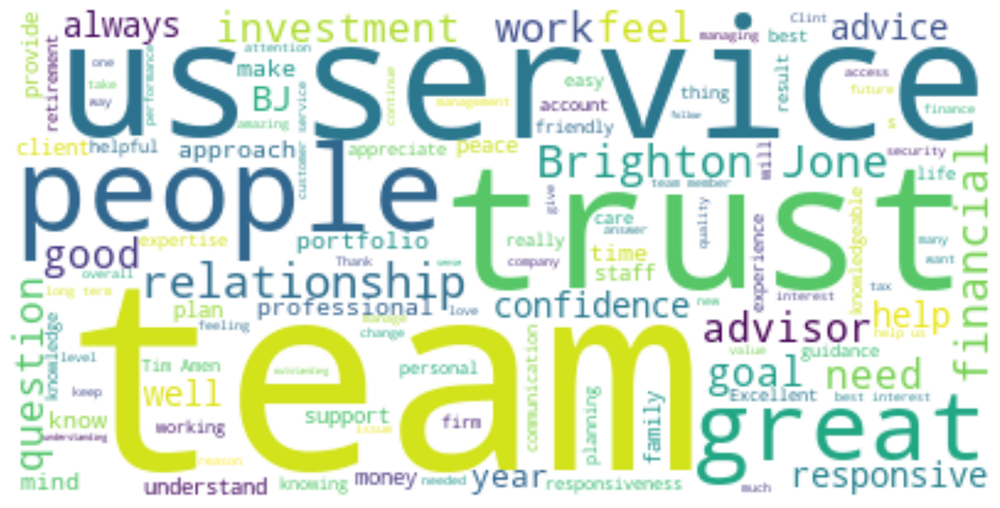

In [333]:
createWordcloud(q6a_g_df, "WHAT_KEEPS_HERE", "q6a_g_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


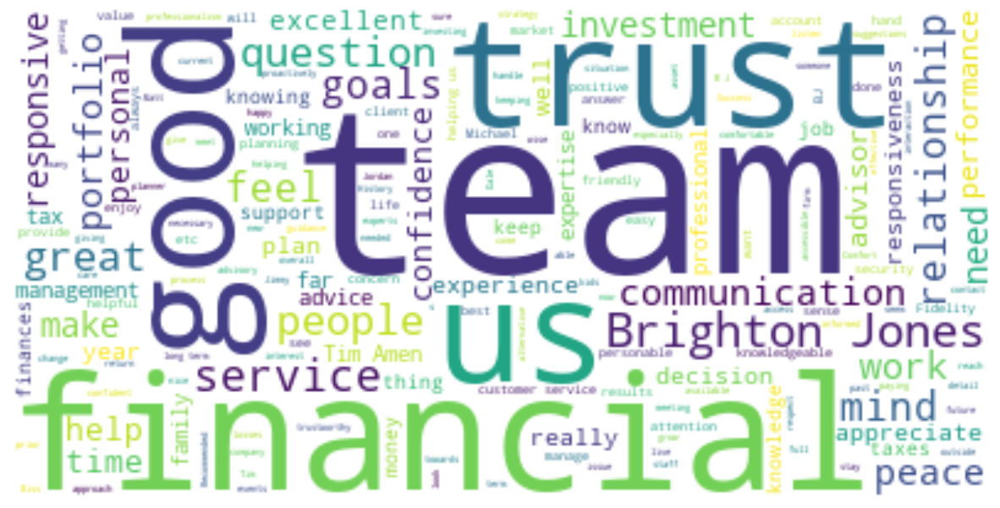

In [334]:
createWordcloud(q6a_y_df, "WHAT_KEEPS_HERE", "q6a_y_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


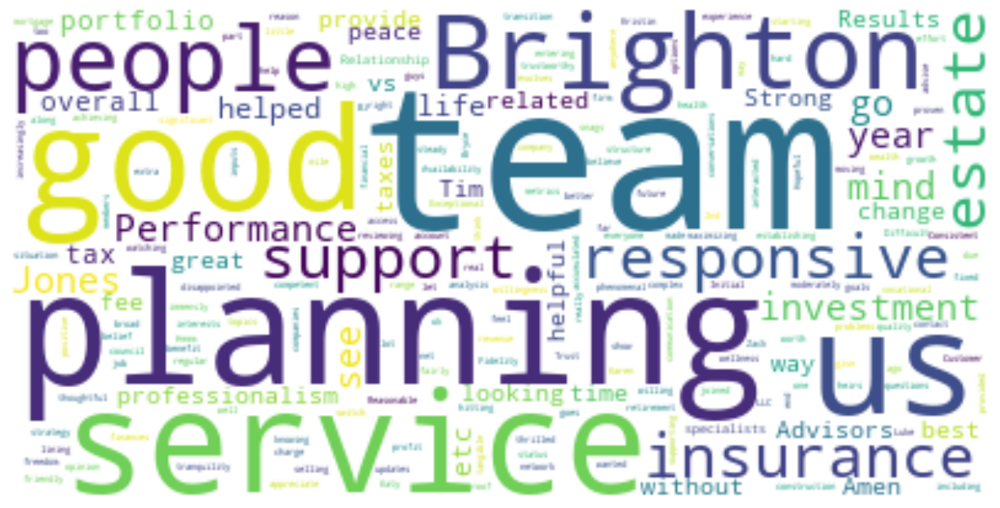

In [335]:
createWordcloud(q6a_r_df, "WHAT_KEEPS_HERE", "q6a_r_df.png")

In [336]:
#q6b: RAR, What needs to improve since 2022
q6b_g_df = q6_df[q6_df["CLIENT_ENGAGEMENT_RANK_C"] == "Green"]
q6b_y_df = q6_df[q6_df["CLIENT_ENGAGEMENT_RANK_C"] == "Yellow"]
q6b_r_df = q6_df[q6_df["CLIENT_ENGAGEMENT_RANK_C"] == "Red"]

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


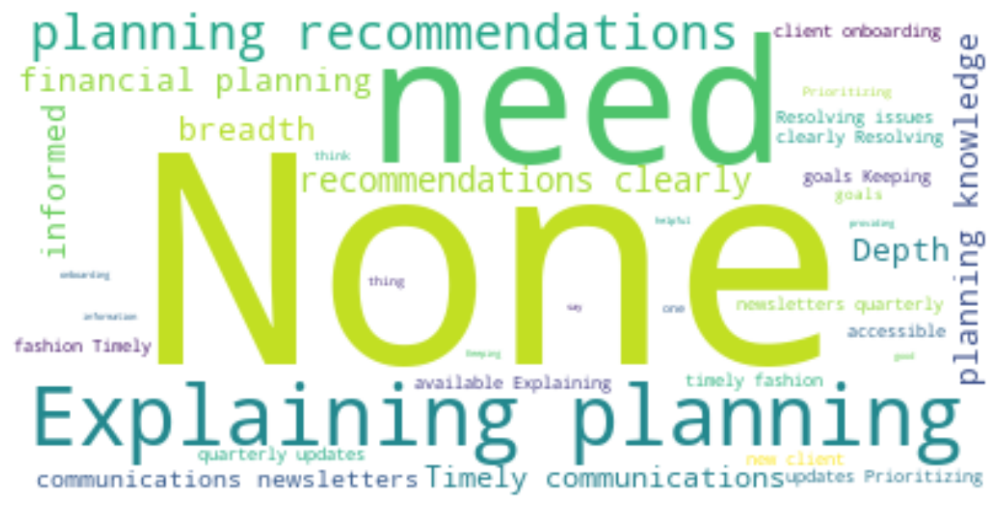

In [337]:
createWordcloud(q6b_g_df, "WHERE_IMPROVE", "q6b_g_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


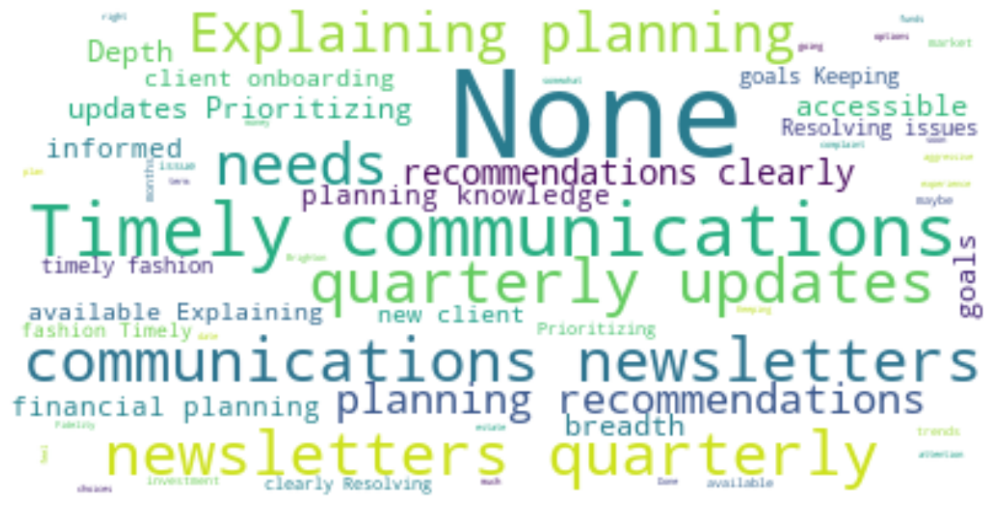

In [338]:
createWordcloud(q6b_y_df, "WHERE_IMPROVE", "q6b_y_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


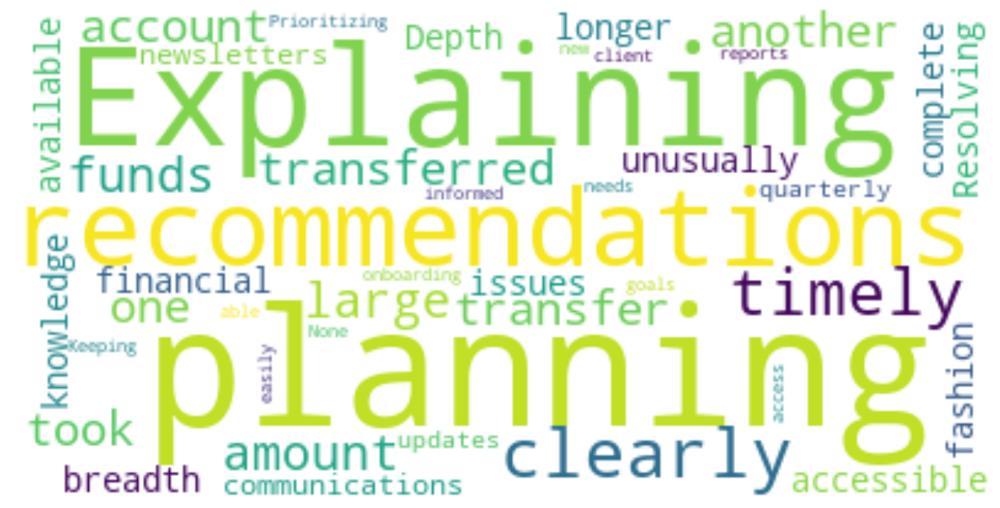

In [339]:
createWordcloud(q6b_r_df, "WHERE_IMPROVE", "q6b_r_df.png")

In [340]:
#q6c: NPS Category, What Keeps since 2022
q6c_de_df = q6_df[q6_df["NPS_CATEGORY"] == "Detractors (0-6)"]
q6c_pa_df = q6_df[q6_df["NPS_CATEGORY"] == "Passives (7-8)"]
q6c_pr_df = q6_df[q6_df["NPS_CATEGORY"] == "Promoters (9-10)"]

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


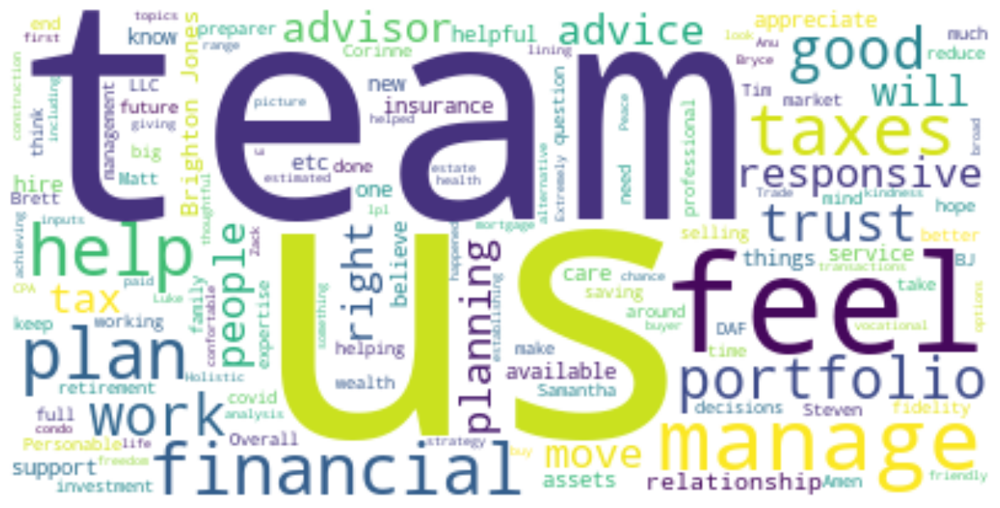

In [341]:
createWordcloud(q6c_de_df, "WHAT_KEEPS_HERE", "q6c_de_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


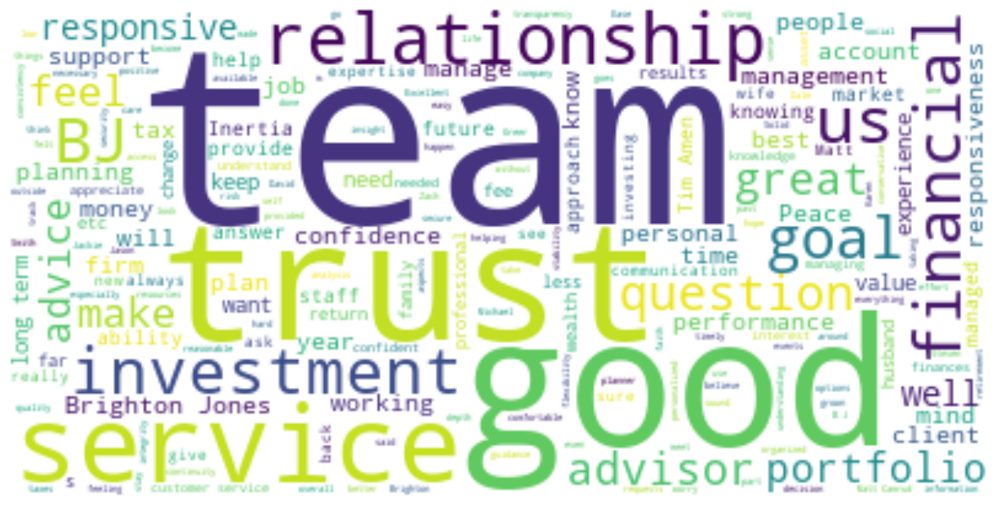

In [342]:
createWordcloud(q6c_pa_df, "WHAT_KEEPS_HERE", "q6c_pa_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


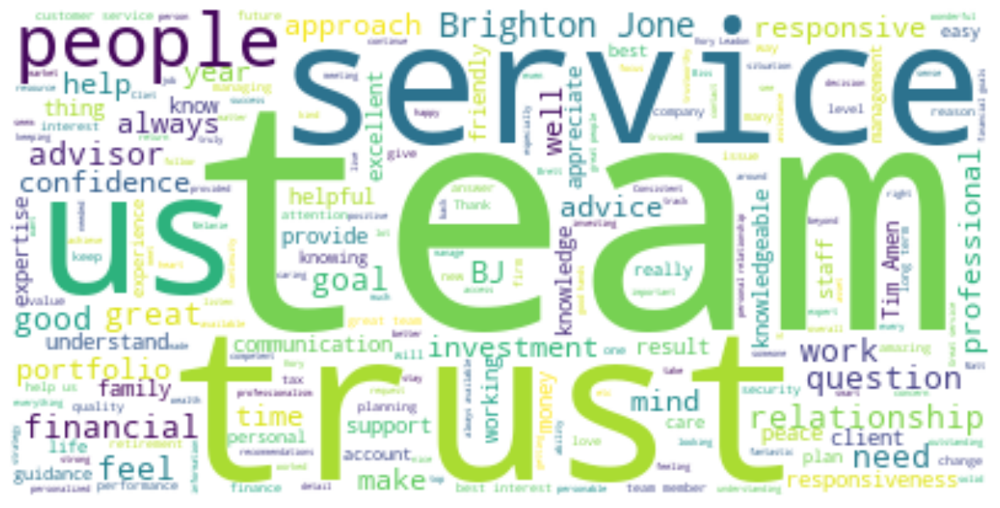

In [343]:
createWordcloud(q6c_pr_df, "WHAT_KEEPS_HERE", "q6c_pr_df.png")

In [344]:
#q6d: NPS Category, What needs to improve since 2022
q6d_de_df = q6_df[q6_df["NPS_CATEGORY"] == "Detractors (0-6)"]
q6d_pa_df = q6_df[q6_df["NPS_CATEGORY"] == "Passives (7-8)"]
q6d_pr_df = q6_df[q6_df["NPS_CATEGORY"] == "Promoters (9-10)"]

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


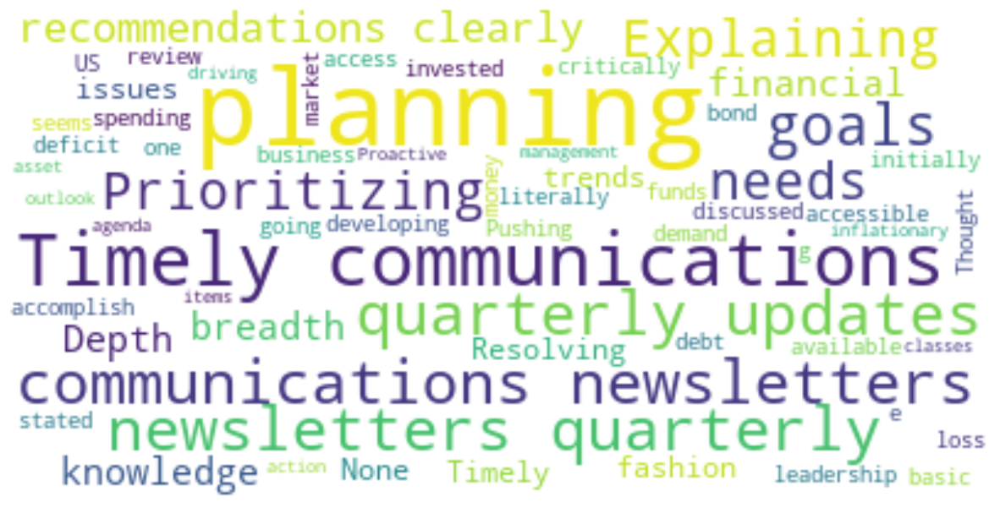

In [345]:
createWordcloud(q6d_de_df, "WHERE_IMPROVE", "q6d_de_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


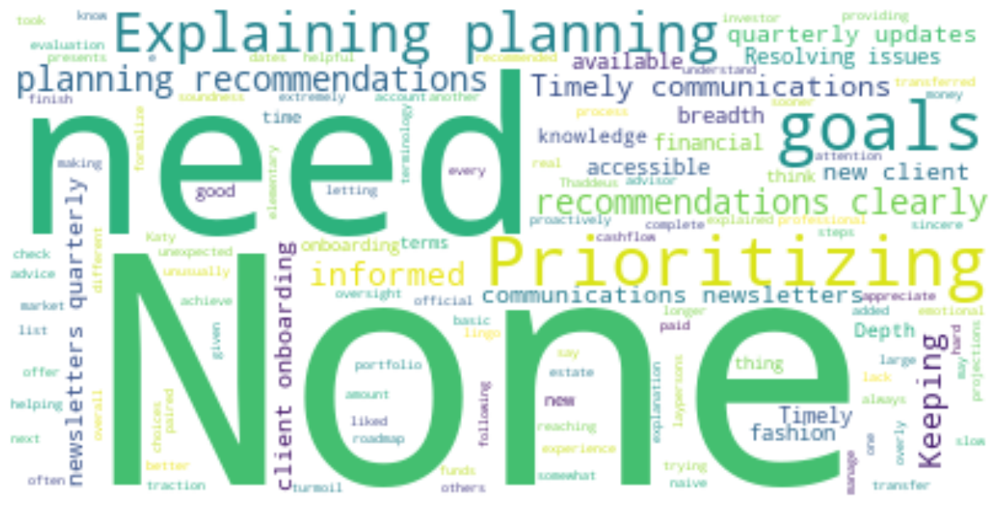

In [346]:
createWordcloud(q6d_pa_df, "WHERE_IMPROVE", "q6d_pa_df.png")

C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf.dropna(subset=[textcol], inplace = True)
C:\Users\davidli\AppData\Local\Temp\ipykernel_15952\3199750208.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datadf[textcol] = datadf[textcol].astype(str)


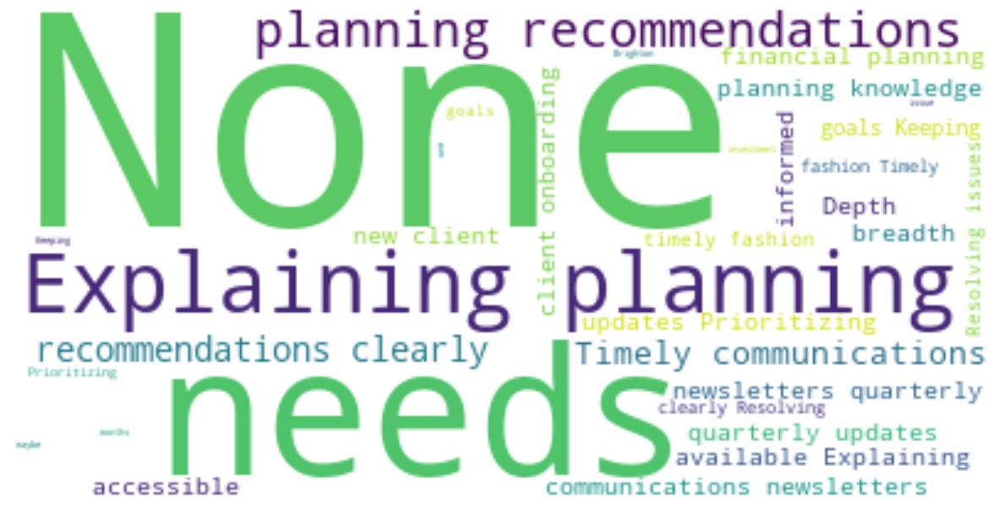

In [347]:
createWordcloud(q6d_pr_df, "WHERE_IMPROVE", "q6d_pr_df.png")